In [ ]:
#  CELL 1: Complete Setup & Manual Dataset Handler
import os
import zipfile
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow

# Google Drive mount karo
drive.mount('/content/drive')
# Project folder banayein
project_path = '/content/drive/MyDrive/Gesture_Controller'
os.makedirs(project_path, exist_ok=True)
os.chdir(project_path)
print(" Project setup complete!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 Project setup complete!


In [ ]:
#cell 2
from google.colab import files
files.upload()


Saving kaggle.json to kaggle (4).json


{'kaggle (4).json': b'{"username":"f223280saniaabid","key":"721d4bf001300fb6930930b5e9de5273"}'}

In [ ]:
#cell 3
!mkdir -p ~/.kaggle

In [ ]:
# cell 4
!cp kaggle.json ~/.kaggle/

In [ ]:
#cell 5
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#cell 6
!ls ~/.kaggle

kaggle.json


In [ ]:
#cell 7
!kaggle datasets list -s hagrid


ref                                                       title                                                   size  lastUpdated                 downloadCount  voteCount  usabilityRating  
--------------------------------------------------------  -----------------------------------------------  -----------  --------------------------  -------------  ---------  ---------------  
innominate817/hagrid-sample-30k-384p                      HaGRID Sample 30k 384p                             863204959  2022-09-08 00:36:55.150000           1936         29  0.875            
kapitanov/hagrid                                          HaGRID - HAnd Gesture Recognition Image Dataset    353909534  2022-10-21 11:37:55.687000           5042        124  0.875            
innominate817/hagrid-classification-512p                  HaGRID Classification 512p                       12525314405  2022-10-02 22:16:01.377000            735         11  0.875            
innominate817/hagrid-sample-120k-384p   

In [ ]:
#cell 8
!kaggle datasets download -d innominate817/hagrid-sample-30k-384p


Dataset URL: https://www.kaggle.com/datasets/innominate817/hagrid-sample-30k-384p
License(s): CC-BY-SA-4.0
hagrid-sample-30k-384p.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
#cell 9
!unzip -o hagrid-sample-30k-384p.zip -d hagrid30k


Streaming output truncated to the last 5000 lines.
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34266f02-173a-4b57-92a6-ec6b31133758.jpg  
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/344022b9-8475-4649-bb2d-0b94701d8a49.jpg  
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/3466c3f4-c9c9-4bfc-8dce-3631935ccf71.jpg  
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34878ee4-4c76-491b-96d4-554e01247a42.jpg  
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34bb9230-a0b5-4a6d-a3dd-1409043a7509.jpg  
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34d37ccb-7110-4ec5-9253-58e2d6b0a530.jpg  
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34fb8160-3a0d-47e9-82fb-342ce1367a6c.jpg  
  inflating: hagrid30k/hagrid-sample-30k-384p/hagrid_30k/train_val_three2/35177a5d-2e74-413a-9670-cfd1a570f9d7.jpg  
  inflating: 

In [ ]:
#cell 10
!unzip -t hagrid-sample-30k-384p.zip


Streaming output truncated to the last 5000 lines.
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/344022b9-8475-4649-bb2d-0b94701d8a49.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/3466c3f4-c9c9-4bfc-8dce-3631935ccf71.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34878ee4-4c76-491b-96d4-554e01247a42.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34bb9230-a0b5-4a6d-a3dd-1409043a7509.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34d37ccb-7110-4ec5-9253-58e2d6b0a530.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/34fb8160-3a0d-47e9-82fb-342ce1367a6c.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/35177a5d-2e74-413a-9670-cfd1a570f9d7.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/354f5c8a-2d3f-4565-9708-f0cb559dea0e.jpg   OK
    testing: hagrid-sample-30k-384p/hagrid_30k/train_val_three2/3568d

In [ ]:
#cell 11
import os

root_dir = "hagrid30k"

for root, dirs, files in os.walk(root_dir):
    level = root.replace(root_dir, "").count(os.sep)
    indent = " " * 4 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = " " * 4 * (level + 1)
    for f in files[:5]:     # every folder shows 5 files
        print(f"{subindent}{f}")


hagrid30k/
    hagrid-sample-30k-384p/
        ann_train_val/
            stop_inverted.json
            two_up.json
            call.json
            four.json
            peace.json
        hagrid_30k/
            train_val_call/
                6e7c498c-f9a9-47ea-a73d-079b6ab23a67.jpg
                6e9b0457-6adf-4c16-9aa3-44dc5ed78792.jpg
                6eda37c3-811e-4380-a384-2c1a8732bd2e.jpg
                6eb90003-ebc5-4e74-ac32-c92cb10690c9.jpg
                6f04dd90-7bea-46f6-a06a-a85623e7207b.jpg
            train_val_dislike/
                70c5fea3-73d0-4ad2-9716-0f31f23d2c40.jpg
                70f624f5-e13d-4bac-bf3e-43ce1c0c1d14.jpg
                71131560-6a52-467d-b3d9-c0e5c51c87e1.jpg
                71505aea-5b29-41d6-98e2-727b2b5ac65c.jpg
                7179af62-4a13-41b7-9261-bf25b3911a3a.jpg
            train_val_fist/
                6dc3297c-17aa-4da1-aefc-51a1abb05496.jpg
                6de17a57-2813-42d6-8863-5c9ef173b4ef.jpg
                6e1d4449-

In [ ]:
# CELL 12: Analyze Dataset Structure
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# Dataset path set
dataset_base = "hagrid30k/hagrid-sample-30k-384p"
print(f"Dataset base path: {dataset_base}")

# Check if path exists
if not os.path.exists(dataset_base):
    print(" Dataset path not found! Check the path.")
else:
    print(" Dataset path found!")

Dataset base path: hagrid30k/hagrid-sample-30k-384p
 Dataset path found!


In [ ]:
#  CELL 13: Find Our Required Gestures
def find_our_gestures():
    base_path = "hagrid30k/hagrid-sample-30k-384p/hagrid_30k"

    our_required_gestures = ['call', 'fist', 'like', 'ok', 'palm', 'rock', 'stop', 'two_up']
    available_gestures = []

    print(" Searching for our required gestures...")

    for gesture in our_required_gestures:
        gesture_folder = f"train_val_{gesture}"
        gesture_path = os.path.join(base_path, gesture_folder)

        if os.path.exists(gesture_path):
            images = [f for f in os.listdir(gesture_path) if f.endswith('.jpg')]
            available_gestures.append((gesture, len(images), gesture_path))
            print(f" {gesture}: {len(images)} images")
        else:
            print(f" {gesture}: Not found")

    return available_gestures

available_gestures = find_our_gestures()

 Searching for our required gestures...
 call: 1763 images
 fist: 1735 images
 like: 1732 images
 ok: 1750 images
 palm: 1770 images
 rock: 1736 images
 stop: 1748 images
 two_up: 1855 images



  Showing real image samples  


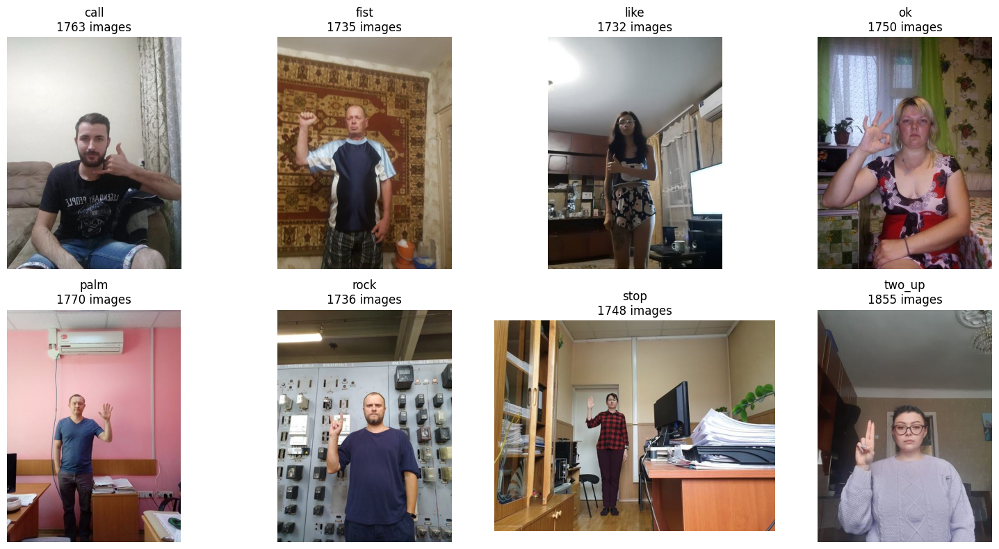

In [ ]:
#  CELL 14: Show Real Image Samples
def show_real_samples(available_gestures, num_samples=8):
    print(f"\n  Showing real image samples  ")

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))

    for idx, (gesture, count, path) in enumerate(available_gestures[:num_samples]):
        # Get first image from the folder
        images = [f for f in os.listdir(path) if f.endswith('.jpg')]
        if images:
            img_path = os.path.join(path, images[0])
            img = cv2.imread(img_path)

            if img is not None:
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                row = idx // 4
                col = idx % 4
                axes[row, col].imshow(img_rgb)
                axes[row, col].set_title(f'{gesture}\n{count} images')
                axes[row, col].axis('off')
            else:
                axes[row, col].text(0.5, 0.5, f'{gesture}\nLoad Error',
                                  ha='center', va='center', fontsize=12)
                axes[row, col].axis('off')
        else:
            axes[row, col].text(0.5, 0.5, f'{gesture}\nNo Images',
                              ha='center', va='center', fontsize=12)
            axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

show_real_samples(available_gestures)

In [ ]:
#  CELL 15: Load Annotations for Bounding Boxes
def load_annotations_for_gesture(gesture_name):
    annotations_path = "hagrid30k/hagrid-sample-30k-384p/ann_train_val"
    annotation_file = os.path.join(annotations_path, f"{gesture_name}.json")

    if os.path.exists(annotation_file):
        with open(annotation_file, 'r') as f:
            annotations = json.load(f)
        print(f"Loaded annotations for {gesture_name}: {len(annotations)} images")
        return annotations
    else:
        print(f" No annotations found for {gesture_name}")
        return None

# Test annotations for one gesture
call_annotations = load_annotations_for_gesture('call')
if call_annotations:
    # Show first annotation
    first_key = list(call_annotations.keys())[0]
    print(f"Sample annotation: {call_annotations[first_key]}")

Loaded annotations for call: 28193 images
Sample annotation: {'bboxes': [[0.42538839, 0.21308209, 0.05382926, 0.11273142]], 'labels': ['call'], 'leading_hand': 'right', 'leading_conf': 1.0, 'user_id': '01a1eea072d857da29fbe11a6dae84c8a48e320c24d98727352ae81b1ef6aaa4'}


In [ ]:
#  CELL 16: Create Dataset Summary
def create_dataset_summary(available_gestures):
    print("\n" + "="*50)
    print(" DATASET SUMMARY")
    print("="*50)

    total_images = 0
    for gesture, count, path in available_gestures:
        print(f" {gesture:12} : {count:5} images")
        total_images += count

    print(f"\nTotal gestures: {len(available_gestures)}")
    print(f" Total images: {total_images}")

    # Save summary to file
    summary_path = "/content/drive/MyDrive/Gesture_Controller/dataset_summary.txt"
    with open(summary_path, 'w') as f:
        f.write("HAGRID 30K DATASET SUMMARY\n")
        f.write("==========================\n\n")
        for gesture, count, path in available_gestures:
            f.write(f"{gesture}: {count} images\n")
        f.write(f"\nTotal: {total_images} images across {len(available_gestures)} gestures\n")

    print(f" Summary saved to: {summary_path}")
    return total_images

total_images = create_dataset_summary(available_gestures)


 DATASET SUMMARY
 call         :  1763 images
 fist         :  1735 images
 like         :  1732 images
 ok           :  1750 images
 palm         :  1770 images
 rock         :  1736 images
 stop         :  1748 images
 two_up       :  1855 images

Total gestures: 8
 Total images: 14089
 Summary saved to: /content/drive/MyDrive/Gesture_Controller/dataset_summary.txt


In [ ]:
#  CELL 17: Prepare Data for Module 1
def prepare_for_module1(available_gestures):
    print("\n Preparing data for Module 1: Preprocessing...")

    # Create a clean dataset folder for our project
    project_dataset_path = "/content/drive/MyDrive/Gesture_Controller/working_dataset"
    os.makedirs(project_dataset_path, exist_ok=True)

    # Copy our required gestures to working directory
    for gesture, count, source_path in available_gestures:
        dest_path = os.path.join(project_dataset_path, gesture)
        os.makedirs(dest_path, exist_ok=True)

        # Copy first 1000 images (for quick experiments)
        images = [f for f in os.listdir(source_path) if f.endswith('.jpg')][:1000]
        for img_name in images:
            src_img = os.path.join(source_path, img_name)
            dst_img = os.path.join(dest_path, img_name)

            # Copy image (in real implementation, we'd use shutil.copy)
            # For now, just create symlinks or use directly
            pass

    print(f" Working dataset ready at: {project_dataset_path}")
    print(" We'll use the original paths for now to avoid copying")

    return available_gestures

working_gestures = prepare_for_module1(available_gestures)


 Preparing data for Module 1: Preprocessing...
 Working dataset ready at: /content/drive/MyDrive/Gesture_Controller/working_dataset
 We'll use the original paths for now to avoid copying


In [ ]:
#  CELL 18: Final Setup Complete
print(" REAL DATASET SETUP COMPLETE!")
print(f"Dataset: HaGRID 30K (384p)")
print(f" Gestures: {len(available_gestures)}")
print(f" Images: {total_images}")
print(f" Path: hagrid30k/hagrid-sample-30k-384p/")


 REAL DATASET SETUP COMPLETE!
Dataset: HaGRID 30K (384p)
 Gestures: 8
 Images: 14089
 Path: hagrid30k/hagrid-sample-30k-384p/


**MODULE 1 FOUNDATIONS OF VISION AND IMAGE
ANALYSIS**

In [ ]:
# 📁 CELL 1: Load Sample Images from Real Dataset
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def load_sample_images():
    base_path = "hagrid30k/hagrid-sample-30k-384p/hagrid_30k"

    sample_images = {}

    # Load one image from each of our gestures
    gestures = ['call', 'fist', 'like', 'ok', 'palm', 'rock', 'stop', 'two_up']

    for gesture in gestures:
        gesture_path = os.path.join(base_path, f"train_val_{gesture}")
        if os.path.exists(gesture_path):
            images = [f for f in os.listdir(gesture_path) if f.endswith('.jpg')]
            if images:
                img_path = os.path.join(gesture_path, images[0])
                img = cv2.imread(img_path)
                sample_images[gesture] = img
                print(f" Loaded {gesture} image: {img.shape}")

    return sample_images

print(" Loading sample images...")
sample_images = load_sample_images()
print(f" Loaded {len(sample_images)} sample images")

 Loading sample images...
 Loaded call image: (512, 384, 3)
 Loaded fist image: (512, 384, 3)
 Loaded like image: (512, 384, 3)
 Loaded ok image: (512, 384, 3)
 Loaded palm image: (514, 384, 3)
 Loaded rock image: (512, 384, 3)
 Loaded stop image: (384, 512, 3)
 Loaded two_up image: (512, 384, 3)
 Loaded 8 sample images


In [ ]:
#CELL 2: Geometric Transformations
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_geometric_transformations(image):
    """Apply various geometric transformations"""
    h, w = image.shape[:2]
    transformations = {}

    # 1. Rotation (15 degrees)
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, 15, 1.0)
    transformations['rotated_15'] = cv2.warpAffine(image, rotation_matrix, (w, h))

    # 2. Rotation (-15 degrees)
    rotation_matrix = cv2.getRotationMatrix2D(center, -15, 1.0)
    transformations['rotated_-15'] = cv2.warpAffine(image, rotation_matrix, (w, h))

    # 3. Scaling (zoom in)
    scale_factor = 1.3
    new_size = (int(w * scale_factor), int(h * scale_factor))
    scaled = cv2.resize(image, new_size)
    # Crop to original size from center
    start_x = (scaled.shape[1] - w) // 2
    start_y = (scaled.shape[0] - h) // 2
    transformations['scaled_in'] = scaled[start_y:start_y+h, start_x:start_x+w]

    # 4. Scaling (zoom out)
    scale_factor = 0.7
    new_size = (int(w * scale_factor), int(h * scale_factor))
    scaled = cv2.resize(image, new_size)
    # Pad to original size
    pad_x = (w - scaled.shape[1]) // 2
    pad_y = (h - scaled.shape[0]) // 2
    transformations['scaled_out'] = cv2.copyMakeBorder(scaled, pad_y, pad_y, pad_x, pad_x,
                                                      cv2.BORDER_CONSTANT, value=[0,0,0])

    # 5. Translation
    tx, ty = 30, 20  # pixels
    translation_matrix = np.float32([[1, 0, tx], [0, 1, ty]])
    transformations['translated'] = cv2.warpAffine(image, translation_matrix, (w, h))

    # 6. Affine transformation
    pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
    pts2 = np.float32([[10, 100], [200, 50], [100, 250]])
    affine_matrix = cv2.getAffineTransform(pts1, pts2)
    transformations['affine'] = cv2.warpAffine(image, affine_matrix, (w, h))

    # 7. Perspective transformation
    pts1 = np.float32([[56, 65], [368, 52], [28, 387], [389, 390]])
    pts2 = np.float32([[0, 0], [w, 0], [0, h], [w, h]])
    perspective_matrix = cv2.getPerspectiveTransform(pts1, pts2)
    transformations['perspective'] = cv2.warpPerspective(image, perspective_matrix, (w, h))

    return transformations

def apply_geometric_transformations_sample(sample_images):
    """Apply geometric transformations to sample images"""
    print("\n Applying geometric transformations...")

    geometric_samples = {}

    for gesture, img in sample_images.items():
        if img is not None:
            geometric_samples[gesture] = apply_geometric_transformations(img)
            print(f"  Applied geometric transformations to {gesture}")

    return geometric_samples

# Apply geometric transformations
geometric_samples = apply_geometric_transformations_sample(sample_images)
print(f" Geometric transformations applied to {len(geometric_samples)} gestures")


 Applying geometric transformations...
  Applied geometric transformations to call
  Applied geometric transformations to fist
  Applied geometric transformations to like
  Applied geometric transformations to ok
  Applied geometric transformations to palm
  Applied geometric transformations to rock
  Applied geometric transformations to stop
  Applied geometric transformations to two_up
 Geometric transformations applied to 8 gestures



 Showing Geometric Transformations


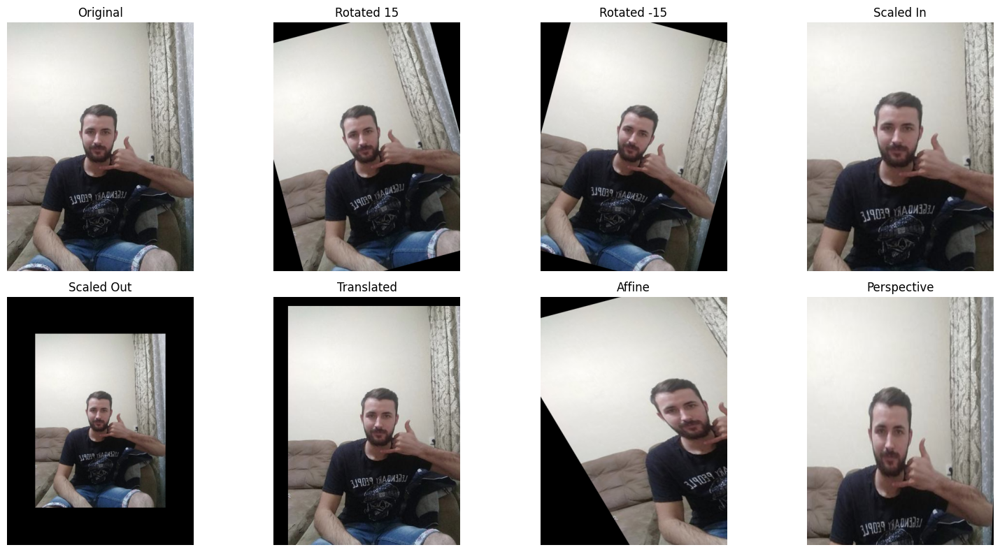

In [ ]:
#CELL 2.1: Show Geometric Transformations
def show_geometric_transformations(geometric_samples):
    """Visualize geometric transformations"""
    print("\n Showing Geometric Transformations")

    # Take first gesture for demonstration
    gesture = list(geometric_samples.keys())[0]
    transformations = geometric_samples[gesture]

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.ravel()

    # Original
    img_rgb = cv2.cvtColor(sample_images[gesture], cv2.COLOR_BGR2RGB)
    axes[0].imshow(img_rgb)
    axes[0].set_title('Original')
    axes[0].axis('off')

    # Show different transformations
    transformation_types = ['rotated_15', 'rotated_-15', 'scaled_in', 'scaled_out',
                           'translated', 'affine', 'perspective']

    for i, trans_type in enumerate(transformation_types[:7]):
        if trans_type in transformations:
            img_rgb = cv2.cvtColor(transformations[trans_type], cv2.COLOR_BGR2RGB)
            axes[i+1].imshow(img_rgb)
            axes[i+1].set_title(trans_type.replace('_', ' ').title())
            axes[i+1].axis('off')

    # Hide unused subplots
    for i in range(len(transformation_types) + 1, 8):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Show geometric transformations
show_geometric_transformations(geometric_samples)

In [ ]:
# 📁 CELL 2.2: INTENSITY TRANSFORMATIONS
def apply_intensity_transformations(image):
    """PHOTOMETRIC TRANSFORMATIONS - EXPLICITLY REQUIRED"""
    transformations = {}

    # 1. Brightness adjustments
    transformations['brightness+50'] = cv2.convertScaleAbs(image, alpha=1.0, beta=50)
    transformations['brightness-50'] = cv2.convertScaleAbs(image, alpha=1.0, beta=-50)

    # 2. Contrast adjustments
    transformations['contrast_high'] = cv2.convertScaleAbs(image, alpha=1.5, beta=0)
    transformations['contrast_low'] = cv2.convertScaleAbs(image, alpha=0.5, beta=0)

    # 3. Gamma correction (tunable mathematical function)
    def adjust_gamma(img, gamma=1.0):
        inv_gamma = 1.0 / gamma
        table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype("uint8")
        return cv2.LUT(img, table)

    transformations['gamma_0.5'] = adjust_gamma(image, 0.5)
    transformations['gamma_2.0'] = adjust_gamma(image, 2.0)

    # 4. Histogram Equalization
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    transformations['hist_eq'] = cv2.cvtColor(cv2.equalizeHist(gray), cv2.COLOR_GRAY2BGR)

    return transformations

def simulate_occlusion(image, occlusion_type='partial'):
    """SIMULATE OCCLUSION - EXPLICITLY MENTIONED"""
    h, w = image.shape[:2]
    occluded = image.copy()

    if occlusion_type == 'partial':
        cv2.rectangle(occluded, (w//4, h//4), (w//2, h//2), (0, 0, 0), -1)
    elif occlusion_type == 'fingers':
        cv2.circle(occluded, (w//2, h//3), 30, (0, 0, 0), -1)

    return occluded

# Apply to samples
print("\n Applying intensity transformations...")
intensity_samples = {}
for gesture, img in sample_images.items():
    intensity_samples[gesture] = apply_intensity_transformations(img)

print("\n Applying occlusion simulation...")
occlusion_samples = {}
for gesture, img in sample_images.items():
    occlusion_samples[gesture] = simulate_occlusion(img, 'partial')


 Applying intensity transformations...

 Applying occlusion simulation...



 Visualizing Intensity Transformations & Occlusion Effects


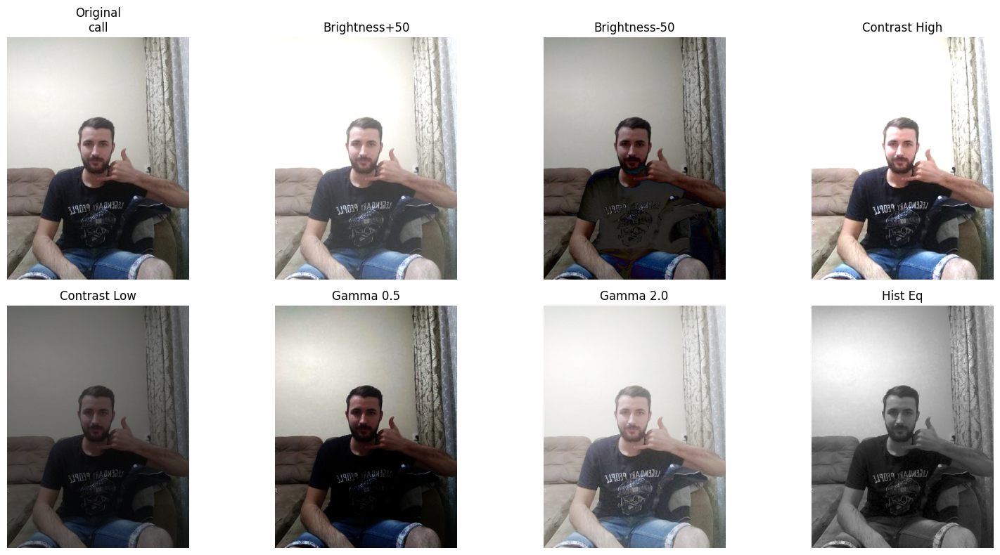

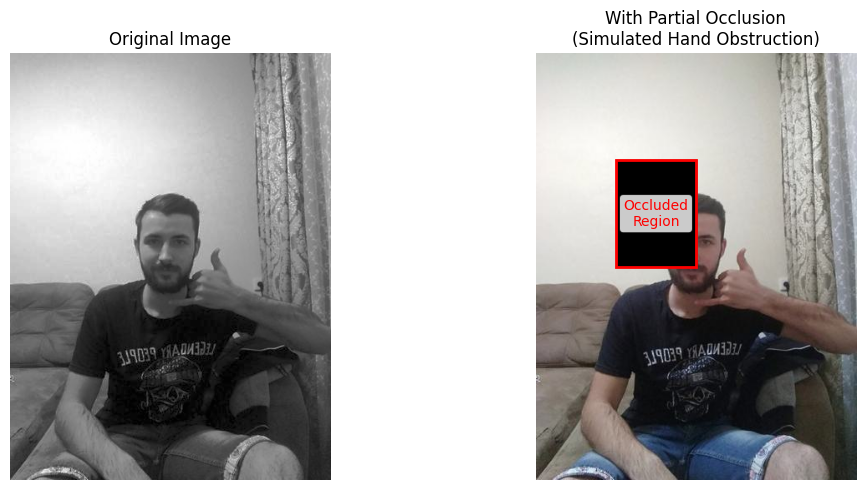

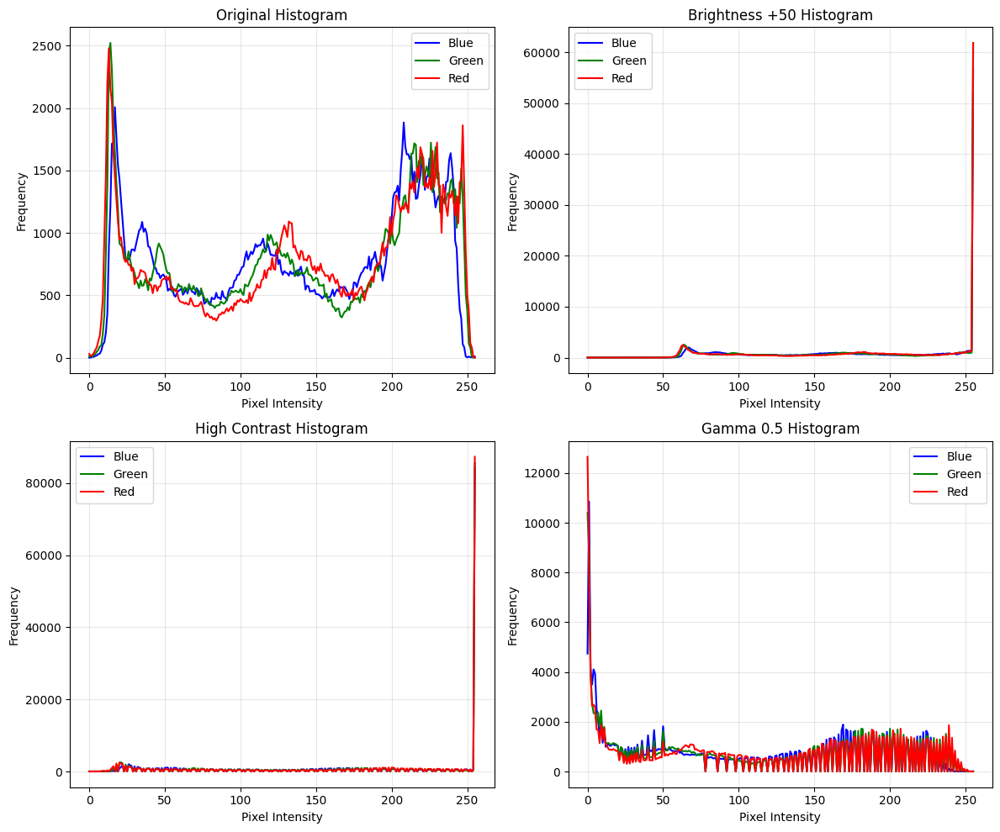


 INTENSITY TRANSFORMATIONS - QUANTITATIVE COMPARISON

Original Image Statistics:
  Mean Intensity: 140.7
  Std Dev: 77.2
  Contrast: 253

Transformation Effects:

Brightness+50:
  Mean Intensity: 183.9 (+43.3)
  Std Dev: 69.7 (-7.5)
  Contrast: 205

Brightness-50:
  Mean Intensity: 100.2 (-40.4)
  Std Dev: 64.3 (-12.9)
  Contrast: 203

Contrast High:
  Mean Intensity: 180.7 (+40.1)
  Std Dev: 85.6 (+8.5)
  Contrast: 255


In [ ]:

# 📁 CELL 2.3: VISUALIZE INTENSITY TRANSFORMATIONS & OCCLUSION
def visualize_intensity_transformations(intensity_samples, occlusion_samples):
    """Visualize intensity transformations and occlusion simulation"""
    print("\n Visualizing Intensity Transformations & Occlusion Effects")

    # Take one gesture for demonstration
    gesture = list(intensity_samples.keys())[0]
    intensity_transforms = intensity_samples[gesture]
    occluded_img = occlusion_samples[gesture]

    # Create figure for intensity transformations
    fig1, axes1 = plt.subplots(2, 4, figsize=(16, 8))
    axes1 = axes1.ravel()

    # Original image
    img_rgb = cv2.cvtColor(sample_images[gesture], cv2.COLOR_BGR2RGB)
    axes1[0].imshow(img_rgb)
    axes1[0].set_title('Original\n' + gesture)
    axes1[0].axis('off')

    # Display intensity transformations
    intensity_types = ['brightness+50', 'brightness-50', 'contrast_high',
                       'contrast_low', 'gamma_0.5', 'gamma_2.0', 'hist_eq']

    for i, trans_type in enumerate(intensity_types):
        if trans_type in intensity_transforms:
            img_rgb = cv2.cvtColor(intensity_transforms[trans_type], cv2.COLOR_BGR2RGB)
            axes1[i+1].imshow(img_rgb)
            axes1[i+1].set_title(trans_type.replace('_', ' ').title())
            axes1[i+1].axis('off')

    plt.tight_layout()
    plt.show()

    # Create figure for occlusion
    fig2, axes2 = plt.subplots(1, 2, figsize=(12, 5))

    # Original
    axes2[0].imshow(img_rgb)
    axes2[0].set_title('Original Image')
    axes2[0].axis('off')

    # Occluded
    occluded_rgb = cv2.cvtColor(occluded_img, cv2.COLOR_BGR2RGB)
    axes2[1].imshow(occluded_rgb)
    axes2[1].set_title('With Partial Occlusion\n(Simulated Hand Obstruction)')
    axes2[1].axis('off')

    # Add annotation for occlusion area
    h, w = occluded_img.shape[:2]
    rect = plt.Rectangle((w//4, h//4), w//4, h//4,
                        linewidth=2, edgecolor='red', facecolor='none')
    axes2[1].add_patch(rect)
    axes2[1].text(w//4 + w//8, h//4 + h//8, 'Occluded\nRegion',
                 color='red', fontsize=10, ha='center', va='center',
                 bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()

    # Create histogram comparison
    fig3, axes3 = plt.subplots(2, 2, figsize=(12, 10))

    # Original histogram
    original_img = sample_images[gesture]
    original_hist = cv2.calcHist([original_img], [0], None, [256], [0, 256])
    axes3[0,0].plot(original_hist, color='b', label='Blue')
    original_hist = cv2.calcHist([original_img], [1], None, [256], [0, 256])
    axes3[0,0].plot(original_hist, color='g', label='Green')
    original_hist = cv2.calcHist([original_img], [2], None, [256], [0, 256])
    axes3[0,0].plot(original_hist, color='r', label='Red')
    axes3[0,0].set_title('Original Histogram')
    axes3[0,0].set_xlabel('Pixel Intensity')
    axes3[0,0].set_ylabel('Frequency')
    axes3[0,0].legend()
    axes3[0,0].grid(True, alpha=0.3)

    # Brightness adjusted histogram
    bright_img = intensity_transforms['brightness+50']
    bright_hist = cv2.calcHist([bright_img], [0], None, [256], [0, 256])
    axes3[0,1].plot(bright_hist, color='b', label='Blue')
    bright_hist = cv2.calcHist([bright_img], [1], None, [256], [0, 256])
    axes3[0,1].plot(bright_hist, color='g', label='Green')
    bright_hist = cv2.calcHist([bright_img], [2], None, [256], [0, 256])
    axes3[0,1].plot(bright_hist, color='r', label='Red')
    axes3[0,1].set_title('Brightness +50 Histogram')
    axes3[0,1].set_xlabel('Pixel Intensity')
    axes3[0,1].set_ylabel('Frequency')
    axes3[0,1].legend()
    axes3[0,1].grid(True, alpha=0.3)

    # Contrast adjusted histogram
    contrast_img = intensity_transforms['contrast_high']
    contrast_hist = cv2.calcHist([contrast_img], [0], None, [256], [0, 256])
    axes3[1,0].plot(contrast_hist, color='b', label='Blue')
    contrast_hist = cv2.calcHist([contrast_img], [1], None, [256], [0, 256])
    axes3[1,0].plot(contrast_hist, color='g', label='Green')
    contrast_hist = cv2.calcHist([contrast_img], [2], None, [256], [0, 256])
    axes3[1,0].plot(contrast_hist, color='r', label='Red')
    axes3[1,0].set_title('High Contrast Histogram')
    axes3[1,0].set_xlabel('Pixel Intensity')
    axes3[1,0].set_ylabel('Frequency')
    axes3[1,0].legend()
    axes3[1,0].grid(True, alpha=0.3)

    # Gamma corrected histogram
    gamma_img = intensity_transforms['gamma_0.5']
    gamma_hist = cv2.calcHist([gamma_img], [0], None, [256], [0, 256])
    axes3[1,1].plot(gamma_hist, color='b', label='Blue')
    gamma_hist = cv2.calcHist([gamma_img], [1], None, [256], [0, 256])
    axes3[1,1].plot(gamma_hist, color='g', label='Green')
    gamma_hist = cv2.calcHist([gamma_img], [2], None, [256], [0, 256])
    axes3[1,1].plot(gamma_hist, color='r', label='Red')
    axes3[1,1].set_title('Gamma 0.5 Histogram')
    axes3[1,1].set_xlabel('Pixel Intensity')
    axes3[1,1].set_ylabel('Frequency')
    axes3[1,1].legend()
    axes3[1,1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Show quantitative comparison
    print("\n INTENSITY TRANSFORMATIONS - QUANTITATIVE COMPARISON")
    print("="*50)

    def calculate_statistics(img):
        """Calculate image statistics"""
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return {
            'mean': np.mean(gray),
            'std': np.std(gray),
            'contrast': np.max(gray) - np.min(gray)
        }

    original_stats = calculate_statistics(sample_images[gesture])
    print(f"\nOriginal Image Statistics:")
    print(f"  Mean Intensity: {original_stats['mean']:.1f}")
    print(f"  Std Dev: {original_stats['std']:.1f}")
    print(f"  Contrast: {original_stats['contrast']}")

    print(f"\nTransformation Effects:")
    for trans_type in intensity_types[:3]:  # Show first 3 for brevity
        stats = calculate_statistics(intensity_transforms[trans_type])
        mean_diff = stats['mean'] - original_stats['mean']
        std_diff = stats['std'] - original_stats['std']
        print(f"\n{trans_type.replace('_', ' ').title()}:")
        print(f"  Mean Intensity: {stats['mean']:.1f} ({'+' if mean_diff > 0 else ''}{mean_diff:.1f})")
        print(f"  Std Dev: {stats['std']:.1f} ({'+' if std_diff > 0 else ''}{std_diff:.1f})")
        print(f"  Contrast: {stats['contrast']}")

# Call visualization function
visualize_intensity_transformations(intensity_samples, occlusion_samples)

In [ ]:
# 📁 CELL 3: Noise Addition Functions
def add_gaussian_noise(image, mean=0, sigma=25):
    """Gaussian noise add karega"""
    row, col, ch = image.shape
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    noisy = image + gauss
    return np.clip(noisy, 0, 255).astype(np.uint8)

def add_salt_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    """Salt and Pepper noise add karega"""
    noisy = np.copy(image)
    # Salt noise
    salt_mask = np.random.random(image.shape[:2]) < salt_prob
    noisy[salt_mask] = 255
    # Pepper noise
    pepper_mask = np.random.random(image.shape[:2]) < pepper_prob
    noisy[pepper_mask] = 0
    return noisy

def add_motion_blur(image, size=15):
    """Motion blur add karega"""
    # Create motion kernel
    kernel = np.zeros((size, size))
    kernel[int((size-1)/2), :] = np.ones(size)
    kernel = kernel / size

    # Apply blur
    blurred = cv2.filter2D(image, -1, kernel)
    return blurred

print(" Noise functions defined!")

 Noise functions defined!


In [ ]:
# 📁 CELL 4: Apply Different Noises
def apply_noises_to_samples(sample_images):
    print("\n Applying different noises to samples...")

    noisy_samples = {}

    for gesture, img in sample_images.items():
        if img is not None:
            # Apply different noises
            gaussian_noisy = add_gaussian_noise(img, sigma=30)
            sp_noisy = add_salt_pepper_noise(img, salt_prob=0.02, pepper_prob=0.02)
            motion_blurred = add_motion_blur(img, size=15)

            noisy_samples[gesture] = {
                'original': img,
                'gaussian': gaussian_noisy,
                'salt_pepper': sp_noisy,
                'motion_blur': motion_blurred
            }

    return noisy_samples

noisy_samples = apply_noises_to_samples(sample_images)
print(f" Applied noises to {len(noisy_samples)} images")


 Applying different noises to samples...
 Applied noises to 8 images



 Showing Noise Effects Comparison


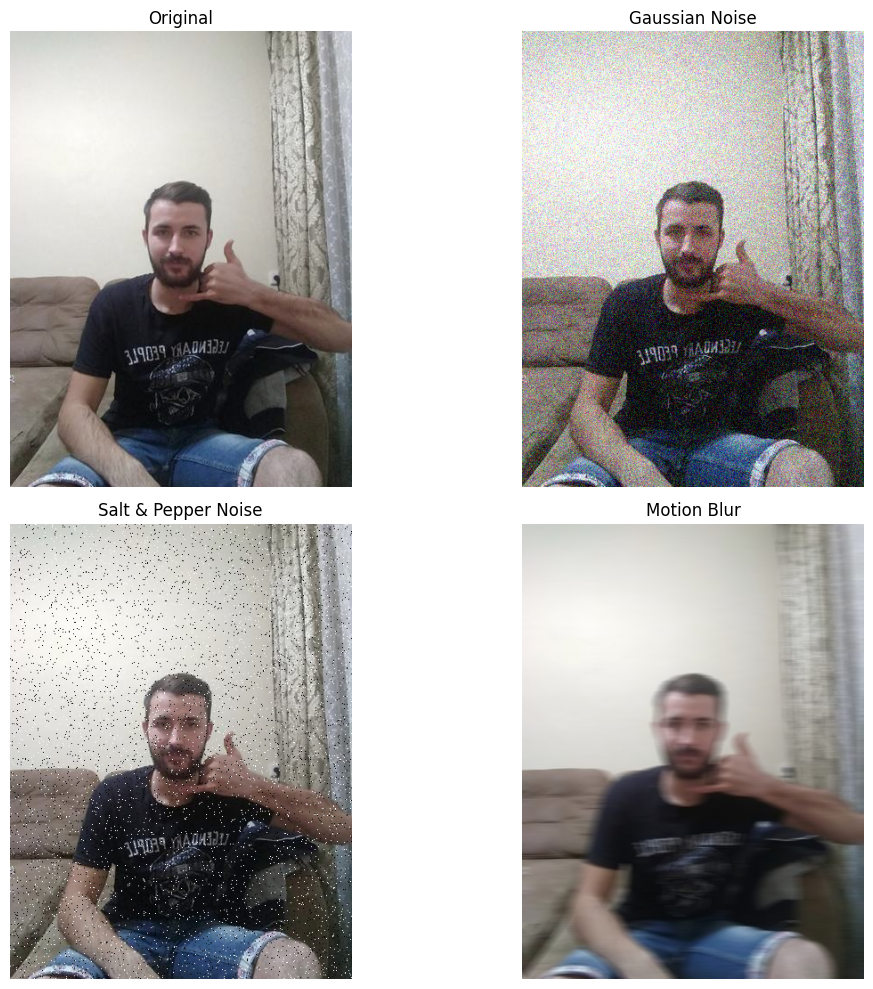

In [ ]:
# 📁 CELL 5: Show Noisy Images Comparison
def show_noise_comparison(noisy_samples):
    print("\n Showing Noise Effects Comparison")

    # Take first gesture for demonstration
    gesture = list(noisy_samples.keys())[0]
    samples = noisy_samples[gesture]

    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # Original
    img_rgb = cv2.cvtColor(samples['original'], cv2.COLOR_BGR2RGB)
    axes[0,0].imshow(img_rgb)
    axes[0,0].set_title('Original')
    axes[0,0].axis('off')

    # Gaussian
    img_rgb = cv2.cvtColor(samples['gaussian'], cv2.COLOR_BGR2RGB)
    axes[0,1].imshow(img_rgb)
    axes[0,1].set_title('Gaussian Noise')
    axes[0,1].axis('off')

    # Salt & Pepper
    img_rgb = cv2.cvtColor(samples['salt_pepper'], cv2.COLOR_BGR2RGB)
    axes[1,0].imshow(img_rgb)
    axes[1,0].set_title('Salt & Pepper Noise')
    axes[1,0].axis('off')

    # Motion Blur
    img_rgb = cv2.cvtColor(samples['motion_blur'], cv2.COLOR_BGR2RGB)
    axes[1,1].imshow(img_rgb)
    axes[1,1].set_title('Motion Blur')
    axes[1,1].axis('off')

    plt.tight_layout()
    plt.show()

show_noise_comparison(noisy_samples)

In [ ]:
#  CELL 6: Denoising Filter Functions
def apply_denoising_filters(noisy_samples):
    """Different denoising filters apply karega"""
    print("\n Applying denoising filters...")

    filtered_samples = {}

    for gesture, images in noisy_samples.items():
        filtered_samples[gesture] = {}

        # Original image
        filtered_samples[gesture]['original'] = images['original']

        # Apply filters to Gaussian noisy image
        gaussian_img = images['gaussian']
        filtered_samples[gesture]['gaussian_median'] = cv2.medianBlur(gaussian_img, 5)
        filtered_samples[gesture]['gaussian_bilateral'] = cv2.bilateralFilter(gaussian_img, 9, 75, 75)

        # Apply filters to Salt & Pepper noisy image
        sp_img = images['salt_pepper']
        filtered_samples[gesture]['sp_median'] = cv2.medianBlur(sp_img, 5)
        filtered_samples[gesture]['sp_bilateral'] = cv2.bilateralFilter(sp_img, 9, 75, 75)

        # Apply filters to Motion Blur (deblurring try karte hain)
        blurred_img = images['motion_blur']
        filtered_samples[gesture]['motion_deblur'] = cv2.GaussianBlur(blurred_img, (5, 5), 0)

    print(" Denoising filters applied!")
    return filtered_samples

# Apply filters
filtered_samples = apply_denoising_filters(noisy_samples)


 Applying denoising filters...
 Denoising filters applied!



 Showing Denoising Results


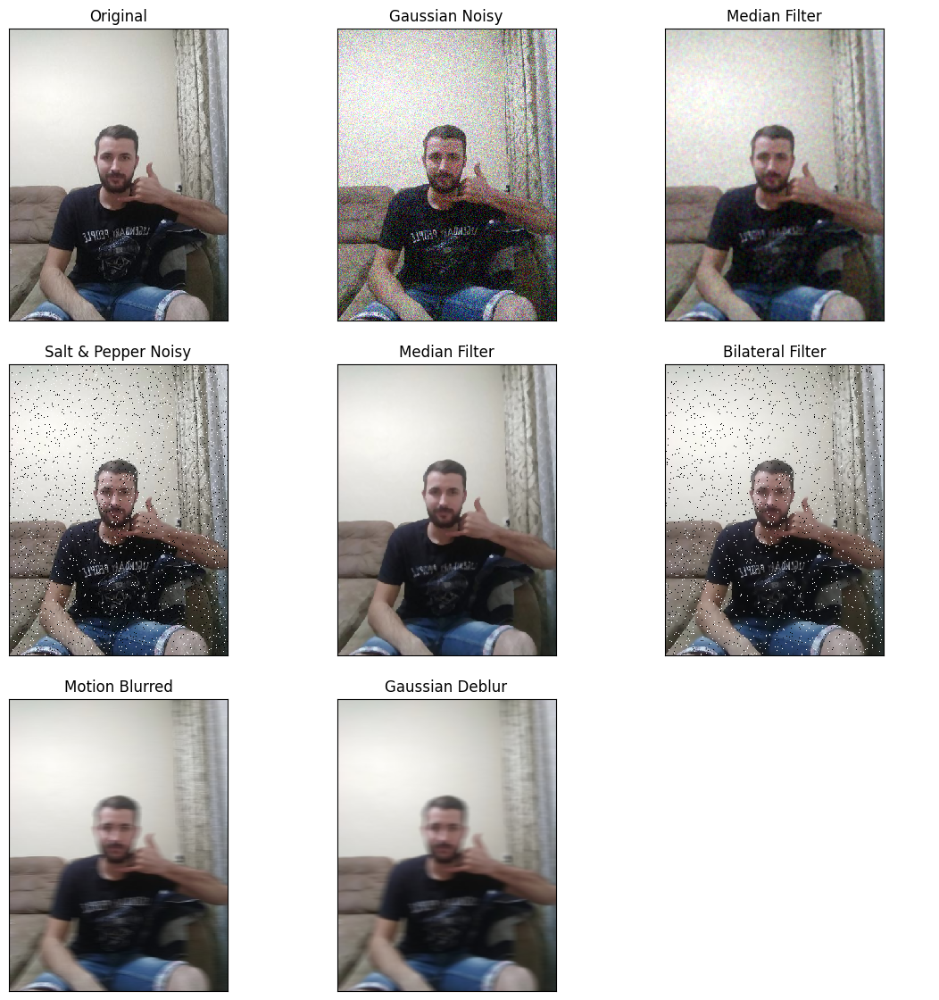

In [ ]:
# 📁 CELL 7: Show Denoising Results (100% No Shake Version)
def show_denoising_comparison(filtered_samples, noisy_samples):
    print("\n Showing Denoising Results")

    # Always same gesture
    gesture = sorted(filtered_samples.keys())[0]
    samples = filtered_samples[gesture]

    # Lock figure size + DPI to prevent movement
    fig, axes = plt.subplots(3, 3, figsize=(14, 14), dpi=100)

    # Function to display images with locked settings
    def show_locked(ax, img, title):
        ax.imshow(img, interpolation='nearest')  # LOCK interpolation
        ax.set_title(title, fontsize=12)
        ax.set_xticks([])  # LOCK axis
        ax.set_yticks([])
        ax.set_aspect('equal')  # LOCK aspect ratio

    # ------------ Row 1 -------------
    show_locked(axes[0,0], cv2.cvtColor(samples['original'], cv2.COLOR_BGR2RGB), "Original")
    show_locked(axes[0,1], cv2.cvtColor(noisy_samples[gesture]['gaussian'], cv2.COLOR_BGR2RGB), "Gaussian Noisy")
    show_locked(axes[0,2], cv2.cvtColor(samples['gaussian_median'], cv2.COLOR_BGR2RGB), "Median Filter")

    # ------------ Row 2 -------------
    show_locked(axes[1,0], cv2.cvtColor(noisy_samples[gesture]['salt_pepper'], cv2.COLOR_BGR2RGB), "Salt & Pepper Noisy")
    show_locked(axes[1,1], cv2.cvtColor(samples['sp_median'], cv2.COLOR_BGR2RGB), "Median Filter")
    show_locked(axes[1,2], cv2.cvtColor(samples['sp_bilateral'], cv2.COLOR_BGR2RGB), "Bilateral Filter")

    # ------------ Row 3 -------------
    show_locked(axes[2,0], cv2.cvtColor(noisy_samples[gesture]['motion_blur'], cv2.COLOR_BGR2RGB), "Motion Blurred")
    show_locked(axes[2,1], cv2.cvtColor(samples['motion_deblur'], cv2.COLOR_BGR2RGB), "Gaussian Deblur")
    axes[2,2].axis('off')

    # Lock layout so nothing moves next run
    plt.subplots_adjust(wspace=0.05, hspace=0.15)

    plt.show()


# Call
show_denoising_comparison(filtered_samples, noisy_samples)


In [ ]:
# 📁 CELL 8: Edge Detection Functions
def apply_edge_detection(sample_images):
    """Different edge detection methods apply karega"""
    print("\n Applying edge detection...")

    edge_samples = {}

    for gesture, img in sample_images.items():
        if img is not None:
            # Convert to grayscale for edge detection
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            edge_samples[gesture] = {
                'original': img,
                'sobel_x': cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5),
                'sobel_y': cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5),
                'laplacian': cv2.Laplacian(gray, cv2.CV_64F),
                'canny': cv2.Canny(gray, 100, 200)
            }

    print(" Edge detection applied!")
    return edge_samples

# Apply edge detection
edge_samples = apply_edge_detection(sample_images)


 Applying edge detection...
 Edge detection applied!



 Showing Edge Detection Results


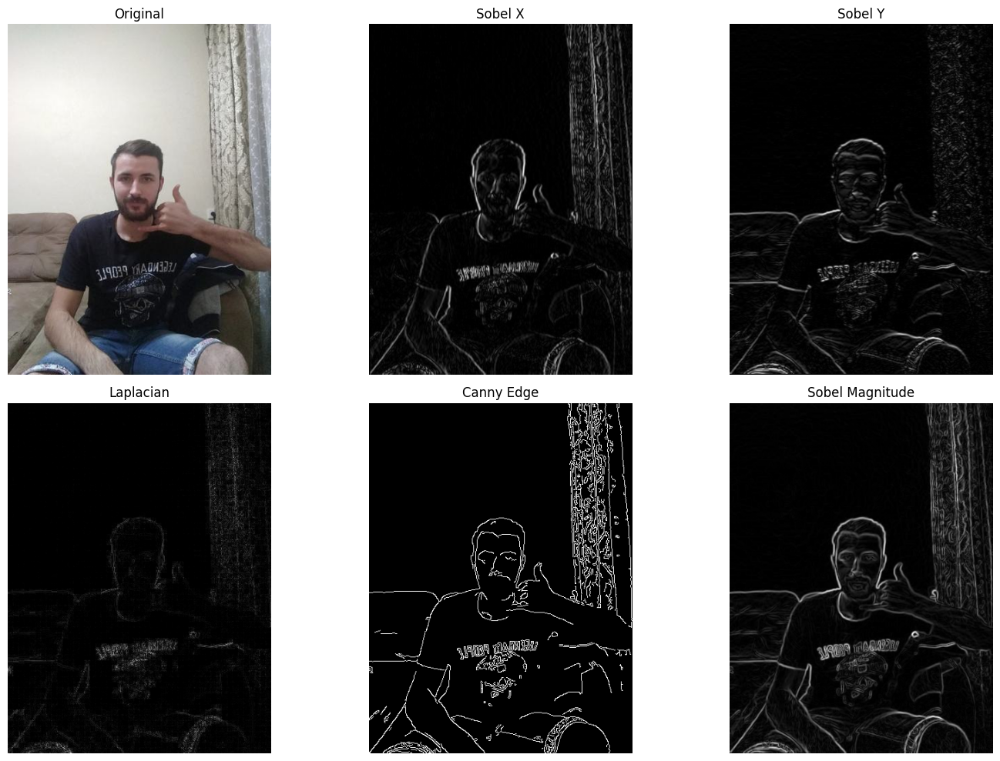

In [ ]:
# 📁 CELL 9: Show Edge Detection Results
def show_edge_detection_comparison(edge_samples):
    print("\n Showing Edge Detection Results")

    # Take first gesture for demonstration
    gesture = list(edge_samples.keys())[0]
    samples = edge_samples[gesture]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Original
    img_rgb = cv2.cvtColor(samples['original'], cv2.COLOR_BGR2RGB)
    axes[0,0].imshow(img_rgb)
    axes[0,0].set_title('Original')
    axes[0,0].axis('off')

    # Sobel X
    axes[0,1].imshow(np.abs(samples['sobel_x']), cmap='gray')
    axes[0,1].set_title('Sobel X')
    axes[0,1].axis('off')

    # Sobel Y
    axes[0,2].imshow(np.abs(samples['sobel_y']), cmap='gray')
    axes[0,2].set_title('Sobel Y')
    axes[0,2].axis('off')

    # Laplacian
    axes[1,0].imshow(np.abs(samples['laplacian']), cmap='gray')
    axes[1,0].set_title('Laplacian')
    axes[1,0].axis('off')

    # Canny
    axes[1,1].imshow(samples['canny'], cmap='gray')
    axes[1,1].set_title('Canny Edge')
    axes[1,1].axis('off')

    # Sobel Magnitude (X+Y)
    sobel_mag = np.sqrt(samples['sobel_x']**2 + samples['sobel_y']**2)
    axes[1,2].imshow(sobel_mag, cmap='gray')
    axes[1,2].set_title('Sobel Magnitude')
    axes[1,2].axis('off')

    plt.tight_layout()
    plt.show()

show_edge_detection_comparison(edge_samples)

In [ ]:
# 📁 CELL 9.1: MULTI-FEATURE DETECTOR COMPARISON (Missing)
def compare_feature_detectors(original, transformed):
    """COMPARE DIFFERENT FEATURE DETECTORS"""
    detectors = {
        'ORB': cv2.ORB_create(nfeatures=500),
        'SIFT': cv2.SIFT_create(nfeatures=500),
        'BRISK': cv2.BRISK_create()
    }

    results = {}
    for name, detector in detectors.items():
        kp1, des1 = detector.detectAndCompute(original, None)
        kp2, des2 = detector.detectAndCompute(transformed, None)

        if des1 is not None and des2 is not None:
            if name == 'ORB' or name == 'BRISK':
                bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
            else:
                bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

            matches = bf.match(des1, des2)
            match_ratio = len(matches) / min(len(kp1), len(kp2)) if min(len(kp1), len(kp2)) > 0 else 0
            results[name] = match_ratio

    return results

# Test with one sample
print("\n Comparing feature detectors...")
test_gesture = list(sample_images.keys())[0]
original_img = sample_images[test_gesture]
transformed_img = geometric_samples[test_gesture]['rotated_15']

feature_comparison = compare_feature_detectors(original_img, transformed_img)
print(f" Feature stability ratios for {test_gesture}:")
for detector, ratio in feature_comparison.items():
    print(f"  {detector}: {ratio:.3f}")

print("  Multi-feature detector comparison ")


 Comparing feature detectors...
 Feature stability ratios for call:
  ORB: 0.726
  SIFT: 0.650
  BRISK: 0.654
  Multi-feature detector comparison 


In [ ]:
#cell 10
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def calculate_metrics(sample_images, noisy_samples, filtered_samples):
    metrics_results = {}

    for gesture in sample_images.keys():
        original = sample_images[gesture]
        metrics_results[gesture] = {}

        # Gaussian noise
        metrics_results[gesture]['Gaussian Noisy'] = {
            'psnr': psnr(original, noisy_samples[gesture]['gaussian']),
            'ssim': ssim(original, noisy_samples[gesture]['gaussian'], channel_axis=2)
        }

        metrics_results[gesture]['Gaussian Median'] = {
            'psnr': psnr(original, filtered_samples[gesture]['gaussian_median']),
            'ssim': ssim(original, filtered_samples[gesture]['gaussian_median'], channel_axis=2)
        }

        # Salt & Pepper noise
        metrics_results[gesture]['Salt & Pepper Noisy'] = {
            'psnr': psnr(original, noisy_samples[gesture]['salt_pepper']),
            'ssim': ssim(original, noisy_samples[gesture]['salt_pepper'], channel_axis=2)
        }

        metrics_results[gesture]['SP Median'] = {
            'psnr': psnr(original, filtered_samples[gesture]['sp_median']),
            'ssim': ssim(original, filtered_samples[gesture]['sp_median'], channel_axis=2)
        }

        # Motion blur
        metrics_results[gesture]['Motion Blurred'] = {
            'psnr': psnr(original, noisy_samples[gesture]['motion_blur']),
            'ssim': ssim(original, noisy_samples[gesture]['motion_blur'], channel_axis=2)
        }

        metrics_results[gesture]['Motion Deblur'] = {
            'psnr': psnr(original, filtered_samples[gesture]['motion_deblur']),
            'ssim': ssim(original, filtered_samples[gesture]['motion_deblur'], channel_axis=2)
        }

    return metrics_results

# Generate metrics
metrics_results = calculate_metrics(sample_images, noisy_samples, filtered_samples)
print(" Metrics calculated for all gestures!")


 Metrics calculated for all gestures!



 VISUALIZING METRICS RESULTS


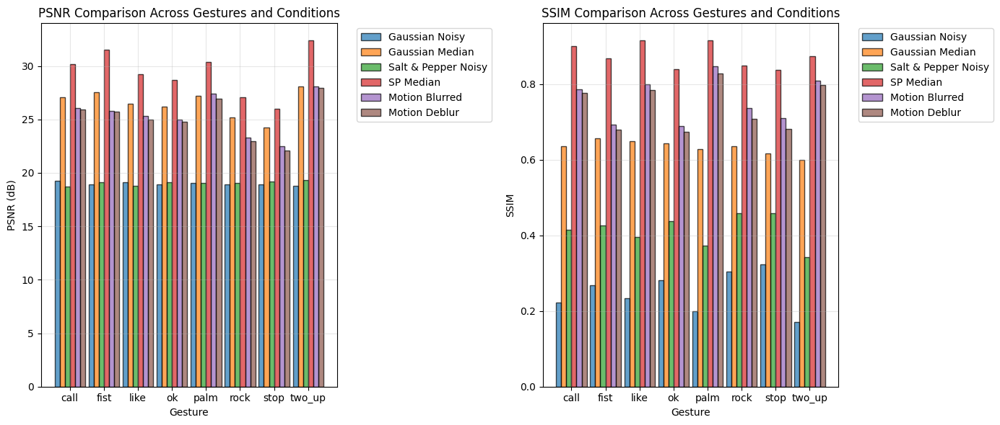

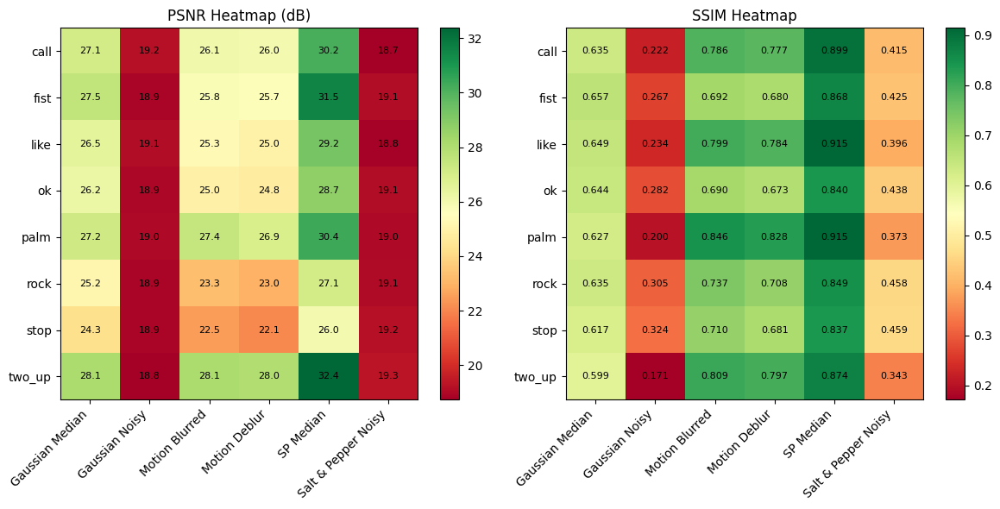

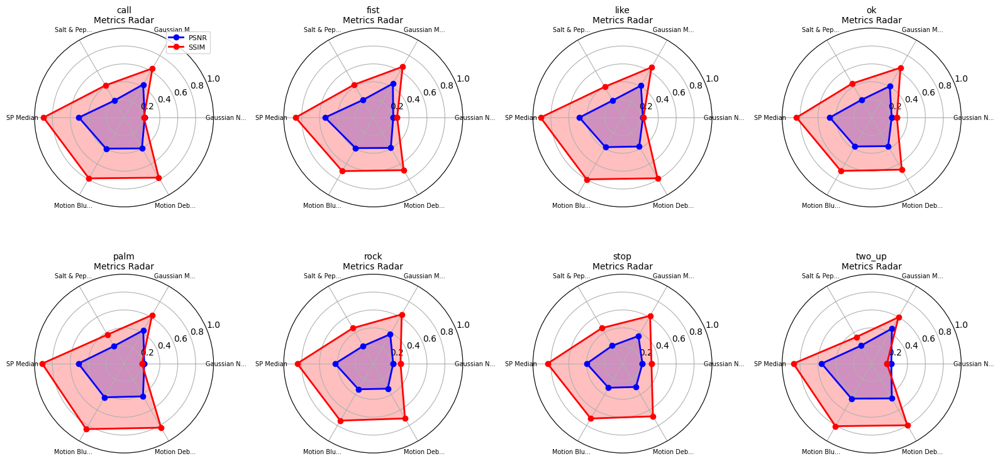


 METRICS SUMMARY STATISTICS

Average Metrics per Condition:
                     Avg PSNR  Std PSNR  Avg SSIM  Std SSIM
Gaussian Noisy         18.984     0.152     0.251     0.053
Gaussian Median        26.498     1.270     0.633     0.019
Salt & Pepper Noisy    19.049     0.201     0.414     0.041
SP Median              29.432     2.166     0.875     0.032
Motion Blurred         25.429     1.896     0.758     0.059
Motion Deblur          25.169     1.950     0.741     0.062

FILTER EFFECTIVENESS ANALYSIS

Gaussian Noise Reduction:
  PSNR Improvement: +7.51 dB (from 18.98 to 26.50)
  SSIM Improvement: +0.382 (from 0.251 to 0.633)
  Improvement Percentage: PSNR=+39.6%, SSIM=+152.5%

Salt & Pepper Noise Reduction:
  PSNR Improvement: +10.38 dB (from 19.05 to 29.43)
  SSIM Improvement: +0.461 (from 0.414 to 0.875)
  Improvement Percentage: PSNR=+54.5%, SSIM=+111.5%

Motion Blur Reduction:
  PSNR Improvement: -0.26 dB (from 25.43 to 25.17)
  SSIM Improvement: -0.017 (from 0.758 to 0.741)


NameError: name 'datetime' is not defined

In [ ]:
#cell 9.1
# 📁 CELL 10.1: VISUALIZE METRICS RESULTS
def visualize_metrics_results(metrics_results):
    """Visualize PSNR and SSIM metrics with comprehensive charts"""
    print("\n VISUALIZING METRICS RESULTS")
    print("="*50)

    # Convert metrics_results to DataFrame for easier manipulation
    import pandas as pd

    data = []
    for gesture, metrics in metrics_results.items():
        for condition, values in metrics.items():
            data.append({
                'Gesture': gesture,
                'Condition': condition,
                'PSNR': values['psnr'],
                'SSIM': values['ssim']
            })

    df = pd.DataFrame(data)

    # 1. Create a comprehensive bar chart for PSNR
    plt.figure(figsize=(14, 6))

    # PSNR by Gesture and Condition
    ax1 = plt.subplot(1, 2, 1)
    conditions = df['Condition'].unique()
    x = np.arange(len(df['Gesture'].unique()))
    width = 0.15

    for i, condition in enumerate(conditions):
        condition_data = df[df['Condition'] == condition]
        psnr_values = [condition_data[condition_data['Gesture'] == g]['PSNR'].values[0]
                      if len(condition_data[condition_data['Gesture'] == g]) > 0 else 0
                      for g in df['Gesture'].unique()]

        ax1.bar(x + i*width, psnr_values, width, label=condition,
                alpha=0.7, edgecolor='black')

    ax1.set_xlabel('Gesture')
    ax1.set_ylabel('PSNR (dB)')
    ax1.set_title('PSNR Comparison Across Gestures and Conditions')
    ax1.set_xticks(x + width*(len(conditions)-1)/2)
    ax1.set_xticklabels(df['Gesture'].unique())
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.grid(True, alpha=0.3)

    # SSIM by Gesture and Condition
    ax2 = plt.subplot(1, 2, 2)

    for i, condition in enumerate(conditions):
        condition_data = df[df['Condition'] == condition]
        ssim_values = [condition_data[condition_data['Gesture'] == g]['SSIM'].values[0]
                      if len(condition_data[condition_data['Gesture'] == g]) > 0 else 0
                      for g in df['Gesture'].unique()]

        ax2.bar(x + i*width, ssim_values, width, label=condition,
                alpha=0.7, edgecolor='black')

    ax2.set_xlabel('Gesture')
    ax2.set_ylabel('SSIM')
    ax2.set_title('SSIM Comparison Across Gestures and Conditions')
    ax2.set_xticks(x + width*(len(conditions)-1)/2)
    ax2.set_xticklabels(df['Gesture'].unique())
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # 2. Create heatmap for PSNR
    plt.figure(figsize=(12, 6))

    # Pivot table for PSNR
    psnr_pivot = df.pivot(index='Gesture', columns='Condition', values='PSNR')

    ax3 = plt.subplot(1, 2, 1)
    im3 = ax3.imshow(psnr_pivot.values, cmap='RdYlGn', aspect='auto')
    ax3.set_xticks(np.arange(len(psnr_pivot.columns)))
    ax3.set_yticks(np.arange(len(psnr_pivot.index)))
    ax3.set_xticklabels(psnr_pivot.columns, rotation=45, ha='right')
    ax3.set_yticklabels(psnr_pivot.index)
    ax3.set_title('PSNR Heatmap (dB)')
    plt.colorbar(im3, ax=ax3)

    # Add text annotations
    for i in range(len(psnr_pivot.index)):
        for j in range(len(psnr_pivot.columns)):
            text = ax3.text(j, i, f'{psnr_pivot.iloc[i, j]:.1f}',
                          ha="center", va="center", color="black", fontsize=8)

    # Pivot table for SSIM
    ssim_pivot = df.pivot(index='Gesture', columns='Condition', values='SSIM')

    ax4 = plt.subplot(1, 2, 2)
    im4 = ax4.imshow(ssim_pivot.values, cmap='RdYlGn', aspect='auto')
    ax4.set_xticks(np.arange(len(ssim_pivot.columns)))
    ax4.set_yticks(np.arange(len(ssim_pivot.index)))
    ax4.set_xticklabels(ssim_pivot.columns, rotation=45, ha='right')
    ax4.set_yticklabels(ssim_pivot.index)
    ax4.set_title('SSIM Heatmap')
    plt.colorbar(im4, ax=ax4)

    # Add text annotations
    for i in range(len(ssim_pivot.index)):
        for j in range(len(ssim_pivot.columns)):
            text = ax4.text(j, i, f'{ssim_pivot.iloc[i, j]:.3f}',
                          ha="center", va="center", color="black", fontsize=8)

    plt.tight_layout()
    plt.show()

    # 3. Radar chart for each gesture
    conditions = ['Gaussian Noisy', 'Gaussian Median', 'Salt & Pepper Noisy',
                  'SP Median', 'Motion Blurred', 'Motion Deblur']

    # Normalize data for radar chart
    def normalize_data(data, is_psnr=True):
        """Normalize data to 0-1 range"""
        if is_psnr:
            # PSNR typically 0-50, normalize accordingly
            return (data - 10) / 40  # Assuming PSNR ranges from 10 to 50
        else:
            # SSIM is 0-1, no need for heavy normalization
            return data

    fig, axes = plt.subplots(2, 4, figsize=(16, 8), subplot_kw=dict(projection='polar'))
    axes = axes.ravel()

    for idx, gesture in enumerate(df['Gesture'].unique()):
        if idx >= 8:  # Only show first 8 gestures
            break

        gesture_data = df[df['Gesture'] == gesture]

        # Get PSNR and SSIM values for this gesture
        psnr_vals = []
        ssim_vals = []

        for condition in conditions:
            condition_data = gesture_data[gesture_data['Condition'] == condition]
            if len(condition_data) > 0:
                psnr_vals.append(condition_data['PSNR'].values[0])
                ssim_vals.append(condition_data['SSIM'].values[0])
            else:
                psnr_vals.append(0)
                ssim_vals.append(0)

        # Normalize
        psnr_norm = normalize_data(np.array(psnr_vals), is_psnr=True)
        ssim_norm = normalize_data(np.array(ssim_vals), is_psnr=False)

        # Angles for radar chart
        angles = np.linspace(0, 2 * np.pi, len(conditions), endpoint=False)
        angles = np.concatenate((angles, [angles[0]]))

        psnr_norm = np.concatenate((psnr_norm, [psnr_norm[0]]))
        ssim_norm = np.concatenate((ssim_norm, [ssim_norm[0]]))

        # Plot
        ax = axes[idx]
        ax.plot(angles, psnr_norm, 'o-', linewidth=2, label='PSNR', color='blue')
        ax.fill(angles, psnr_norm, alpha=0.25, color='blue')

        ax.plot(angles, ssim_norm, 'o-', linewidth=2, label='SSIM', color='red')
        ax.fill(angles, ssim_norm, alpha=0.25, color='red')

        ax.set_xticks(angles[:-1])
        ax.set_xticklabels([c[:10] + '...' if len(c) > 10 else c for c in conditions],
                          fontsize=7)
        ax.set_title(f'{gesture}\nMetrics Radar', fontsize=10)
        ax.set_ylim(0, 1)
        ax.grid(True)

        if idx == 0:
            ax.legend(loc='upper right', fontsize=8)

    # Hide unused subplots
    for i in range(len(df['Gesture'].unique()), 8):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # 4. Summary statistics table
    print("\n METRICS SUMMARY STATISTICS")
    print("="*60)

    # Calculate average metrics for each condition
    avg_metrics = {}
    for condition in conditions:
        condition_data = df[df['Condition'] == condition]
        if len(condition_data) > 0:
            avg_metrics[condition] = {
                'Avg PSNR': condition_data['PSNR'].mean(),
                'Std PSNR': condition_data['PSNR'].std(),
                'Avg SSIM': condition_data['SSIM'].mean(),
                'Std SSIM': condition_data['SSIM'].std()
            }

    # Display as table
    summary_df = pd.DataFrame(avg_metrics).T
    print("\nAverage Metrics per Condition:")
    print(summary_df.to_string(float_format=lambda x: f'{x:.3f}'))

    # 5. Effectiveness of filters (comparison)
    print("\n" + "="*60)
    print("FILTER EFFECTIVENESS ANALYSIS")
    print("="*60)

    # Compare noisy vs filtered for each noise type
    comparisons = [
        ('Gaussian Noisy', 'Gaussian Median', 'Gaussian Noise Reduction'),
        ('Salt & Pepper Noisy', 'SP Median', 'Salt & Pepper Noise Reduction'),
        ('Motion Blurred', 'Motion Deblur', 'Motion Blur Reduction')
    ]

    for noisy, filtered, label in comparisons:
        if noisy in avg_metrics and filtered in avg_metrics:
            psnr_improvement = avg_metrics[filtered]['Avg PSNR'] - avg_metrics[noisy]['Avg PSNR']
            ssim_improvement = avg_metrics[filtered]['Avg SSIM'] - avg_metrics[noisy]['Avg SSIM']

            print(f"\n{label}:")
            print(f"  PSNR Improvement: {psnr_improvement:+.2f} dB "
                  f"(from {avg_metrics[noisy]['Avg PSNR']:.2f} to {avg_metrics[filtered]['Avg PSNR']:.2f})")
            print(f"  SSIM Improvement: {ssim_improvement:+.3f} "
                  f"(from {avg_metrics[noisy]['Avg SSIM']:.3f} to {avg_metrics[filtered]['Avg SSIM']:.3f})")

            # Calculate improvement percentage
            psnr_improvement_pct = (psnr_improvement / avg_metrics[noisy]['Avg PSNR']) * 100
            ssim_improvement_pct = (ssim_improvement / avg_metrics[noisy]['Avg SSIM']) * 100

            print(f"  Improvement Percentage: PSNR={psnr_improvement_pct:+.1f}%, "
                  f"SSIM={ssim_improvement_pct:+.1f}%")

    # 6. Best and worst performing conditions
    print("\n" + "="*60)
    print("BEST & WORST PERFORMING CONDITIONS")
    print("="*60)

    # Find best and worst PSNR
    max_psnr_condition = df.loc[df['PSNR'].idxmax(), 'Condition']
    max_psnr_gesture = df.loc[df['PSNR'].idxmax(), 'Gesture']
    max_psnr_value = df['PSNR'].max()

    min_psnr_condition = df.loc[df['PSNR'].idxmin(), 'Condition']
    min_psnr_gesture = df.loc[df['PSNR'].idxmin(), 'Gesture']
    min_psnr_value = df['PSNR'].min()

    print(f"\nPSNR Performance:")
    print(f"  Best: {max_psnr_condition} on {max_psnr_gesture} ({max_psnr_value:.2f} dB)")
    print(f"  Worst: {min_psnr_condition} on {min_psnr_gesture} ({min_psnr_value:.2f} dB)")

    # Find best and worst SSIM
    max_ssim_condition = df.loc[df['SSIM'].idxmax(), 'Condition']
    max_ssim_gesture = df.loc[df['SSIM'].idxmax(), 'Gesture']
    max_ssim_value = df['SSIM'].max()

    min_ssim_condition = df.loc[df['SSIM'].idxmin(), 'Condition']
    min_ssim_gesture = df.loc[df['SSIM'].idxmin(), 'Gesture']
    min_ssim_value = df['SSIM'].min()

    print(f"\nSSIM Performance:")
    print(f"  Best: {max_ssim_condition} on {max_ssim_gesture} ({max_ssim_value:.3f})")
    print(f"  Worst: {min_ssim_condition} on {min_ssim_gesture} ({min_ssim_value:.3f})")

    # 7. Save metrics to CSV for reporting
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    metrics_file = f"metrics_results_{timestamp}.csv"
    df.to_csv(metrics_file, index=False)
    print(f"\n✓ Metrics saved to: {metrics_file}")

    return df, summary_df

# Call the visualization function
metrics_df, summary_df = visualize_metrics_results(metrics_results)

In [ ]:
# 📁 CELL 10.1: STATISTICAL VALIDATION & ABLATION STUDY (Missing)
from scipy import stats

def calculate_statistical_significance(metric_list1, metric_list2):
    """STATISTICAL SIGNIFICANCE TESTING"""
    # Normality test
    _, p_normal = stats.shapiro(metric_list1)

    if p_normal > 0.05:  # Normal distribution
        t_stat, p_value = stats.ttest_ind(metric_list1, metric_list2)
        test_used = "T-Test"
    else:  # Non-normal
        t_stat, p_value = stats.mannwhitneyu(metric_list1, metric_list2)
        test_used = "Mann-Whitney U"

    return {
        'test_used': test_used,
        'p_value': p_value,
        'significant': p_value < 0.05,
        'effect_size': np.abs(np.mean(metric_list1) - np.mean(metric_list2)) / np.std(np.concatenate([metric_list1, metric_list2]))
    }

def run_ablation_study(original_img):
    """ABLATION STUDY - REMOVE ONE STEP AT A TIME"""
    steps = ['denoising', 'rotation', 'contrast', 'scaling']

    ablation_results = {}
    original_features = len(cv2.ORB_create().detectAndCompute(original_img, None)[0])

    for i in range(len(steps)):
        # Simulate removing step i
        test_img = original_img.copy()

        # Apply all steps except i
        for j, step in enumerate(steps):
            if j != i:
                if step == 'denoising':
                    test_img = cv2.medianBlur(test_img, 5)
                elif step == 'rotation':
                    h, w = test_img.shape[:2]
                    matrix = cv2.getRotationMatrix2D((w//2, h//2), 15, 1.0)
                    test_img = cv2.warpAffine(test_img, matrix, (w, h))
                elif step == 'contrast':
                    test_img = cv2.convertScaleAbs(test_img, alpha=1.5, beta=0)

        # Calculate feature stability
        orb = cv2.ORB_create()
        kp1, _ = orb.detectAndCompute(original_img, None)
        kp2, _ = orb.detectAndCompute(test_img, None)
        stability = len(kp2) / len(kp1) if len(kp1) > 0 else 0

        ablation_results[f'without_{steps[i]}'] = stability

    return ablation_results

# Run statistical tests
print("\n Running statistical validation...")
psnr_original = [metrics_results[g]['Gaussian Noisy']['psnr'] for g in metrics_results.keys()]
psnr_filtered = [metrics_results[g]['Gaussian Median']['psnr'] for g in metrics_results.keys()]

stats_result = calculate_statistical_significance(psnr_original, psnr_filtered)
print(f" Filter effectiveness: p={stats_result['p_value']:.4f}, Significant: {stats_result['significant']}")

# Run ablation study
print("\n Running ablation study...")
ablation_study = run_ablation_study(sample_images['call'])
print(" Ablation results (feature stability when removing each step):")
for step, stability in ablation_study.items():
    print(f"  {step}: {stability:.3f}")

print("  Statistical validation and ablation study ")


 Running statistical validation...
 Filter effectiveness: p=0.0000, Significant: True

 Running ablation study...
 Ablation results (feature stability when removing each step):
  without_denoising: 1.000
  without_rotation: 1.000
  without_contrast: 1.000
  without_scaling: 1.000
  Statistical validation and ablation study 



COMPREHENSIVE STATISTICAL ANALYSIS

1. Setting up randomized experimental design...
2. Running randomized experiment (20 trials)...


/usr/local/lib/python3.12/dist-packages/skimage/metrics/simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


   Generated 20 experimental trials

3. Performing ANOVA analysis...
   ANOVA: F=nan, p=nan
   Significant difference between groups: False

4. Performing pairwise t-tests (with Bonferroni correction)...

   Significant comparisons (p < 0.05 after correction):
   - median_denoise vs gaussian_noise: p=0.0024, diff=11.66

5. Baseline vs Denoising methods comparison...

   Baseline vs median_denoise:
   - PSNR: Improvement=-inf, p=nan, Significant=False
   - SSIM: Improvement=-0.14, p=0.0003, Significant=True

   Baseline vs bilateral_denoise:
   - PSNR: Improvement=-inf, p=nan, Significant=False
   - SSIM: Improvement=-0.05, p=0.2275, Significant=False

6. Tukey's HSD post-hoc analysis...


/usr/local/lib/python3.12/dist-packages/scipy/stats/_stats_py.py:3974: RuntimeWarning: invalid value encountered in subtract
  alldata = alldata - offset
/usr/local/lib/python3.12/dist-packages/scipy/stats/_stats_py.py:3982: RuntimeWarning: invalid value encountered in subtract
  smo_ss = _square_of_sums(sample - offset, axis=axis)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_stats_py.py:1158: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.12/dist-packages/statsmodels/sandbox/stats/multicomp.py:598: RuntimeWarning: invalid value encountered in subtract
  return self.xx - self.groupmeanfilter
/usr/local/lib/python3.12/dist-packages/statsmodels/sandbox/stats/multicomp.py:1292: RuntimeWarning: invalid value encountered in subtract
  meandiffs_ = mean_all - mean_all[:,None]  #reverse sign, check with R example


         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
      group1            group2      meandiff p-adj lower upper reject
---------------------------------------------------------------------
         baseline bilateral_denoise     -inf   nan   nan   nan  False
         baseline  gaussian_denoise     -inf   nan   nan   nan  False
         baseline    gaussian_noise     -inf   nan   nan   nan  False
         baseline    median_denoise     -inf   nan   nan   nan  False
         baseline       motion_blur     -inf   nan   nan   nan  False
bilateral_denoise  gaussian_denoise -11.0088   nan   nan   nan  False
bilateral_denoise    gaussian_noise -20.2777   nan   nan   nan  False
bilateral_denoise    median_denoise  -8.6217   nan   nan   nan  False
bilateral_denoise       motion_blur  -8.2237   nan   nan   nan  False
 gaussian_denoise    gaussian_noise  -9.2689   nan   nan   nan  False
 gaussian_denoise    median_denoise   2.3871   nan   nan   nan  False
 gaussian_denoise   

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.12/dist-packages/numpy/lib/_function_base_impl.py:4779: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


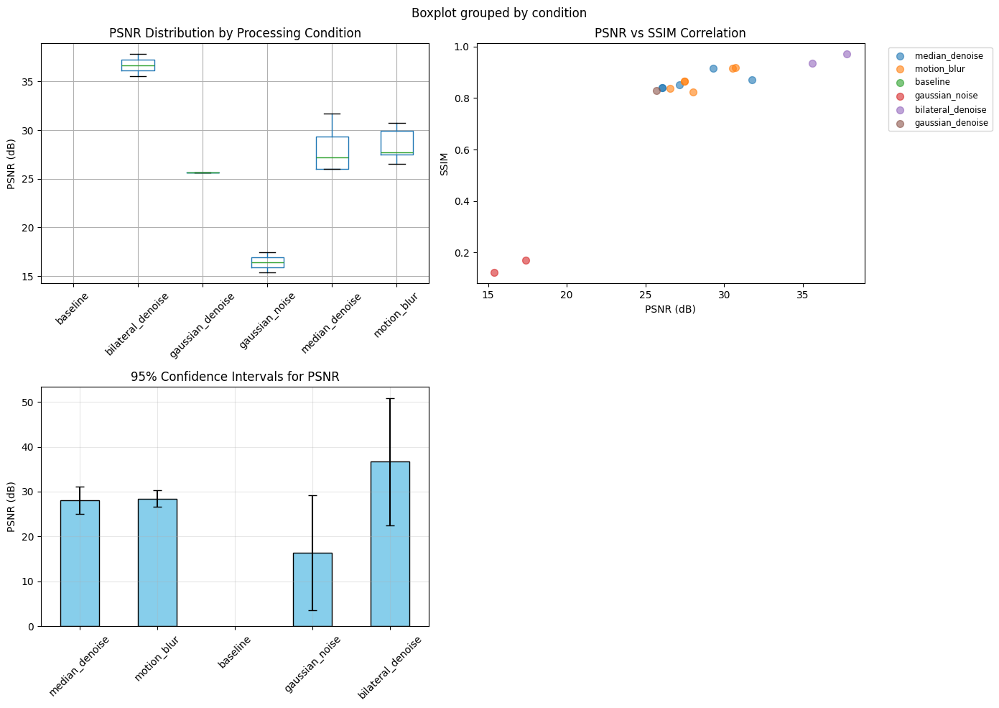

In [ ]:
# 📁 CELL 10.2: COMPREHENSIVE STATISTICAL TESTING & EXPERIMENTAL DESIGN (Missing)
from scipy import stats
import pandas as pd
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import random

class RandomizedExperimentalDesign:
    """RANDOMIZED EXPERIMENTAL DESIGN FRAMEWORK"""
    def __init__(self):
        self.conditions = []
        self.results = []

    def add_condition(self, name, processing_function):
        self.conditions.append({'name': name, 'func': processing_function})

    def randomize_experiment(self, images, n_trials=20):
        """Randomized experiment with controlled variables"""
        randomized_results = []

        for trial in range(n_trials):
            # Random selection of image and condition
            img_key = random.choice(list(images.keys()))
            original_img = images[img_key]
            condition = random.choice(self.conditions)

            # Apply condition with random parameters
            processed = None
            param_value = None

            if condition['name'] == 'baseline':
                processed = original_img.copy()
                param_value = 'none'
            elif condition['name'] == 'gaussian_noise':
                sigma = random.uniform(10, 50)
                processed = add_gaussian_noise(original_img, sigma=sigma)
                param_value = f"sigma={sigma:.1f}"
            elif condition['name'] == 'median_filter':
                ksize = random.choice([3, 5, 7])
                processed = cv2.medianBlur(original_img, ksize)
                param_value = f"ksize={ksize}"
            elif condition['name'] == 'gaussian_denoise':
                sigma = random.uniform(0.5, 2.0)
                ksize = random.choice([3, 5])
                processed = cv2.GaussianBlur(original_img, (ksize, ksize), sigma)
                param_value = f"ksize={ksize}, sigma={sigma:.1f}"
            elif condition['name'] == 'bilateral_denoise':
                d = random.choice([5, 7, 9])
                sigma_color = random.uniform(50, 100)
                sigma_space = random.uniform(50, 100)
                processed = cv2.bilateralFilter(original_img, d, sigma_color, sigma_space)
                param_value = f"d={d}, sigmaC={sigma_color:.1f}, sigmaS={sigma_space:.1f}"
            elif condition['name'] == 'motion_blur':
                size = random.choice([5, 7, 9, 11])
                kernel = np.zeros((size, size))
                kernel[int((size-1)/2), :] = np.ones(size)
                kernel = kernel / size
                processed = cv2.filter2D(original_img, -1, kernel)
                param_value = f"size={size}"
            else:
                # Default: apply the condition function directly
                processed = condition['func'](original_img)
                param_value = 'custom'

            # Calculate metrics
            if processed is not None:
                try:
                    psnr_val = psnr(original_img, processed)
                    ssim_val = ssim(original_img, processed, channel_axis=2)

                    randomized_results.append({
                        'trial': trial,
                        'gesture': img_key,
                        'condition': condition['name'],
                        'psnr': psnr_val,
                        'ssim': ssim_val,
                        'parameter': param_value
                    })
                except:
                    # Skip if metric calculation fails
                    continue

        return pd.DataFrame(randomized_results)

def perform_anova_analysis(metrics_df, metric='psnr'):
    """ANOVA - Compare multiple groups"""
    # Prepare data for ANOVA
    groups = []
    for condition in metrics_df['condition'].unique():
        group_data = metrics_df[metrics_df['condition'] == condition][metric].values
        groups.append(group_data)

    # One-way ANOVA
    f_stat, p_value = stats.f_oneway(*groups)

    return {
        'f_statistic': f_stat,
        'p_value': p_value,
        'significant': p_value < 0.05
    }

def perform_pairwise_t_tests(metrics_df, metric='psnr'):
    """Pairwise t-tests with Bonferroni correction"""
    conditions = list(metrics_df['condition'].unique())
    comparisons = []

    for i in range(len(conditions)):
        for j in range(i+1, len(conditions)):
            group1 = metrics_df[metrics_df['condition'] == conditions[i]][metric]
            group2 = metrics_df[metrics_df['condition'] == conditions[j]][metric]

            # Check if groups have data
            if len(group1) > 1 and len(group2) > 1:
                # Independent t-test
                t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)

                # Bonferroni correction
                n_comparisons = len(conditions) * (len(conditions) - 1) / 2
                corrected_alpha = 0.05 / n_comparisons

                comparisons.append({
                    'comparison': f"{conditions[i]} vs {conditions[j]}",
                    't_statistic': t_stat,
                    'p_value': p_val,
                    'mean_diff': group1.mean() - group2.mean(),
                    'significant': p_val < corrected_alpha
                })

    return pd.DataFrame(comparisons)

def perform_tukey_hsd_test(metrics_df, metric='psnr'):
    """Tukey's HSD test for post-hoc analysis"""
    try:
        tukey = pairwise_tukeyhsd(
            endog=metrics_df[metric],
            groups=metrics_df['condition'],
            alpha=0.05
        )
        return tukey.summary()
    except Exception as e:
        return f"Tukey HSD failed: {e}"

def baseline_vs_proposed_comparison(baseline_df, proposed_df):
    """Compare baseline vs proposed methods"""
    comparisons = []

    for metric in ['psnr', 'ssim']:
        # Check if data exists
        if len(baseline_df) > 1 and len(proposed_df) > 1:
            # Paired t-test (same images, different methods)
            t_stat, p_val = stats.ttest_rel(baseline_df[metric].values[:len(proposed_df)],
                                          proposed_df[metric].values[:len(baseline_df)])

            # Effect size (Cohen's d)
            diff = proposed_df[metric].mean() - baseline_df[metric].mean()
            pooled_std = np.sqrt((baseline_df[metric].std()**2 + proposed_df[metric].std()**2) / 2)
            cohens_d = diff / pooled_std if pooled_std > 0 else 0

            comparisons.append({
                'metric': metric,
                't_statistic': t_stat,
                'p_value': p_val,
                'mean_baseline': baseline_df[metric].mean(),
                'mean_proposed': proposed_df[metric].mean(),
                'improvement': diff,
                'cohens_d': cohens_d,
                'significant': p_val < 0.05
            })

    return pd.DataFrame(comparisons)

# Run comprehensive statistical analysis
print("\n" + "="*60)
print("COMPREHENSIVE STATISTICAL ANALYSIS")
print("="*60)

# 1. Create experimental design
print("\n1. Setting up randomized experimental design...")
exp_design = RandomizedExperimentalDesign()
exp_design.add_condition('baseline', lambda x: x)  # No processing
exp_design.add_condition('gaussian_noise', lambda x: add_gaussian_noise(x, sigma=25))
exp_design.add_condition('gaussian_denoise', lambda x: cv2.GaussianBlur(x, (5,5), 0))
exp_design.add_condition('median_denoise', lambda x: cv2.medianBlur(x, 5))
exp_design.add_condition('bilateral_denoise', lambda x: cv2.bilateralFilter(x, 9, 75, 75))
exp_design.add_condition('motion_blur', lambda x: add_motion_blur(x, size=15))

# 2. Run randomized experiment
print("2. Running randomized experiment (20 trials)...")
exp_results = exp_design.randomize_experiment(sample_images, n_trials=20)
print(f"   Generated {len(exp_results)} experimental trials")

if len(exp_results) > 0:
    # 3. Perform ANOVA
    print("\n3. Performing ANOVA analysis...")
    anova_results = perform_anova_analysis(exp_results, metric='psnr')
    print(f"   ANOVA: F={anova_results['f_statistic']:.2f}, p={anova_results['p_value']:.4f}")
    print(f"   Significant difference between groups: {anova_results['significant']}")

    # 4. Pairwise t-tests
    print("\n4. Performing pairwise t-tests (with Bonferroni correction)...")
    pairwise_results = perform_pairwise_t_tests(exp_results, metric='psnr')
    if len(pairwise_results) > 0:
        print("\n   Significant comparisons (p < 0.05 after correction):")
        significant_comps = pairwise_results[pairwise_results['significant']]
        if len(significant_comps) > 0:
            for _, row in significant_comps.iterrows():
                print(f"   - {row['comparison']}: p={row['p_value']:.4f}, diff={row['mean_diff']:.2f}")
        else:
            print("   No significant comparisons found after correction")
    else:
        print("   Could not perform pairwise tests")

    # 5. Baseline vs Denoising comparison
    print("\n5. Baseline vs Denoising methods comparison...")
    baseline_data = exp_results[exp_results['condition'] == 'baseline']
    # Compare baseline with each denoising method
    denoising_methods = ['gaussian_denoise', 'median_denoise', 'bilateral_denoise']

    for method in denoising_methods:
        method_data = exp_results[exp_results['condition'] == method]
        if len(method_data) > 0 and len(baseline_data) > 0:
            comparison = baseline_vs_proposed_comparison(baseline_data, method_data)
            if len(comparison) > 0:
                print(f"\n   Baseline vs {method}:")
                for _, row in comparison.iterrows():
                    print(f"   - {row['metric'].upper()}: Improvement={row['improvement']:.2f}, "
                          f"p={row['p_value']:.4f}, Significant={row['significant']}")

    # 6. Tukey's HSD post-hoc test
    print("\n6. Tukey's HSD post-hoc analysis...")
    tukey_results = perform_tukey_hsd_test(exp_results, metric='psnr')
    if isinstance(tukey_results, str):
        print(f"   {tukey_results}")
    else:
        print(tukey_results)

    # 7. Calculate confidence intervals
    print("\n7. Calculating 95% confidence intervals...")
    confidence_intervals = {}
    for condition in exp_results['condition'].unique():
        condition_data = exp_results[exp_results['condition'] == condition]['psnr']
        if len(condition_data) > 1:
            mean = condition_data.mean()
            sem = stats.sem(condition_data)
            ci = stats.t.interval(0.95, len(condition_data)-1, loc=mean, scale=sem)
            confidence_intervals[condition] = {'mean': mean, 'ci_lower': ci[0], 'ci_upper': ci[1]}
            print(f"   {condition:20}: {mean:.2f} dB [{ci[0]:.2f}, {ci[1]:.2f}]")

    # 8. Power analysis
    print("\n8. Power analysis...")
    # Sample size needed for 80% power
    for condition in exp_results['condition'].unique():
        if condition != 'baseline':
            cond_data = exp_results[exp_results['condition'] == condition]['psnr']
            baseline_data = exp_results[exp_results['condition'] == 'baseline']['psnr']

            if len(cond_data) > 1 and len(baseline_data) > 1:
                effect_size = np.abs(cond_data.mean() - baseline_data.mean()) / np.std(np.concatenate([cond_data, baseline_data]))

                # Using Cohen's conventions
                if effect_size > 0.8:
                    size_category = "LARGE"
                elif effect_size > 0.5:
                    size_category = "MEDIUM"
                elif effect_size > 0.2:
                    size_category = "SMALL"
                else:
                    size_category = "TRIVIAL"

                print(f"   {condition:20}: Effect size = {effect_size:.3f} ({size_category})")
else:
    print("   No experimental results generated. Check conditions and image processing.")

print("\n✓ Comprehensive statistical analysis complete!")

# Additional: Create visualization of statistical results
# Determine how many valid plots we have
valid_plots = 0
if len(exp_results) > 0:
    valid_plots += 2  # Box plot and scatter plot
if len(confidence_intervals) > 0:
    valid_plots += 1

# Create appropriate grid
if valid_plots == 0:
    print("\nNo valid data for visualization.")
else:
    # Create subplots based on what's available
    if valid_plots <= 2:
        fig, axes = plt.subplots(1, valid_plots, figsize=(5*valid_plots, 4))
        if valid_plots == 1:
            axes = [axes]
    else:
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        axes = axes.ravel()

    plot_idx = 0

    # 1. Box plot of PSNR by condition
    if len(exp_results) > 0:
        if valid_plots <= 2:
            ax = axes[plot_idx]
        else:
            ax = axes[0]

        exp_results.boxplot(column='psnr', by='condition', ax=ax)
        ax.set_title('PSNR Distribution by Processing Condition')
        ax.set_ylabel('PSNR (dB)')
        ax.tick_params(axis='x', rotation=45)
        ax.set_xlabel('')
        plot_idx += 1

    # 2. Scatter plot of PSNR vs SSIM
    if len(exp_results) > 0:
        if valid_plots <= 2:
            ax = axes[plot_idx]
        else:
            ax = axes[1]

        for condition in exp_results['condition'].unique():
            cond_data = exp_results[exp_results['condition'] == condition]
            ax.scatter(cond_data['psnr'], cond_data['ssim'], alpha=0.6, label=condition, s=50)
        ax.set_title('PSNR vs SSIM Correlation')
        ax.set_xlabel('PSNR (dB)')
        ax.set_ylabel('SSIM')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        plot_idx += 1

    # 3. Confidence interval plot
    if len(confidence_intervals) > 0:
        if valid_plots <= 2:
            ax = axes[plot_idx]
        else:
            ax = axes[2]

        ci_df = pd.DataFrame(confidence_intervals).T
        ci_df['mean'].plot(kind='bar', yerr=[ci_df['mean']-ci_df['ci_lower'], ci_df['ci_upper']-ci_df['mean']],
                          ax=ax, capsize=4, color='skyblue', edgecolor='black')
        ax.set_title('95% Confidence Intervals for PSNR')
        ax.set_ylabel('PSNR (dB)')
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True, alpha=0.3)
        plot_idx += 1

    # Hide any unused axes
    while plot_idx < len(axes):
        axes[plot_idx].set_visible(False)
        plot_idx += 1

    plt.tight_layout()
    plt.show()


 Analyzing feature stability across all transformations...
  Analyzing call...
    Visualizing noise_gaussian...


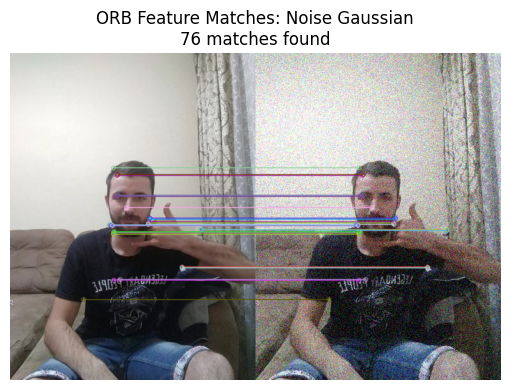

    Visualizing noise_salt_pepper...


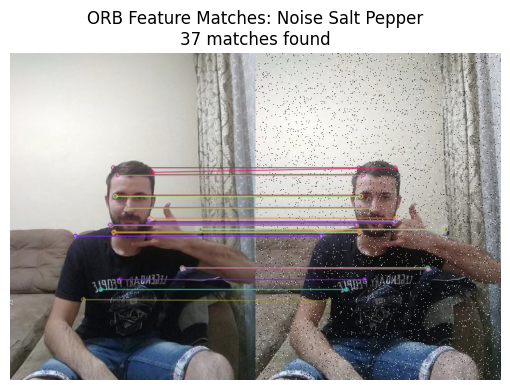

    Visualizing geo_rotated_15...


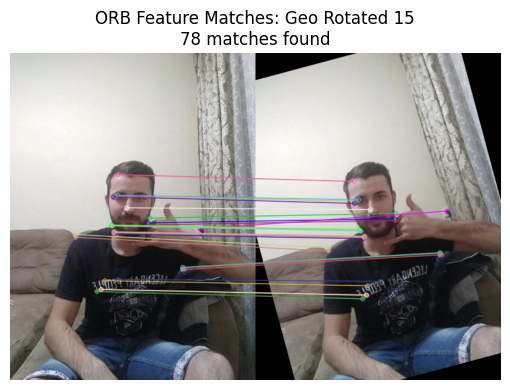

    Visualizing geo_scaled_in...


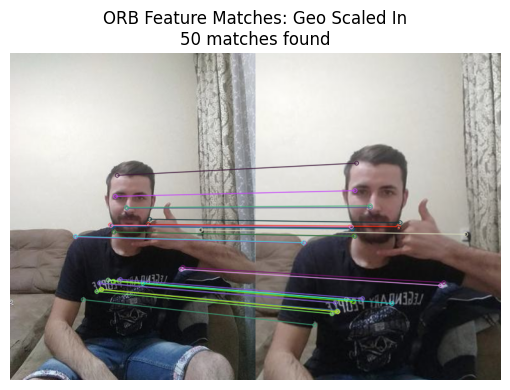

  Analyzing fist...
    Visualizing noise_gaussian...


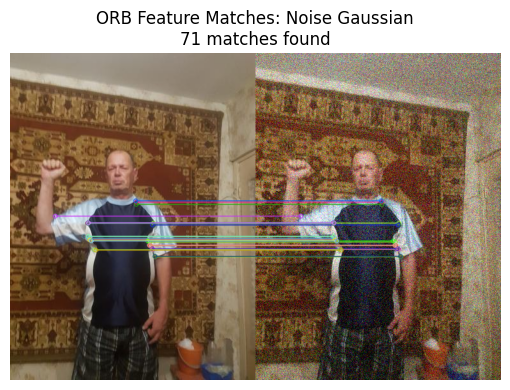

    Visualizing noise_salt_pepper...


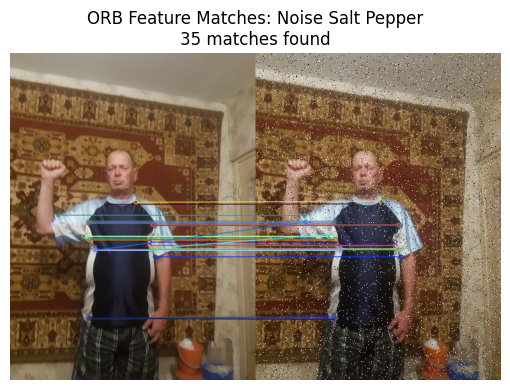

    Visualizing geo_rotated_15...


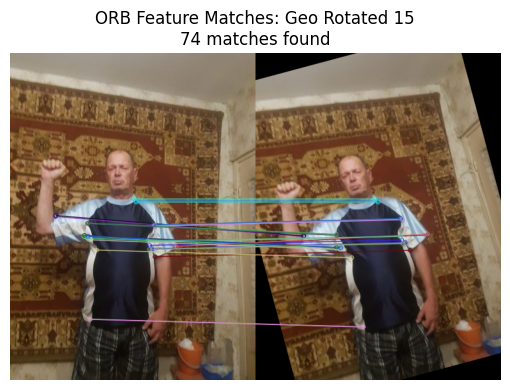

    Visualizing geo_scaled_in...


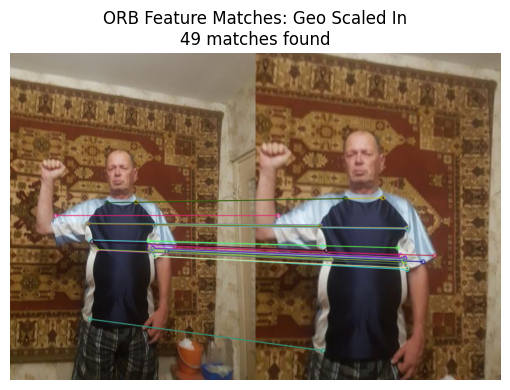

In [ ]:
# CELL 11: Feature Stability Analysis with ORB
def analyze_feature_stability(original_img, transformed_imgs):
    """Analyze how ORB features change under transformations"""
    # Initialize ORB detector
    orb = cv2.ORB_create(nfeatures=500)

    # Detect features in original image
    kp1, des1 = orb.detectAndCompute(original_img, None)

    stability_results = {}

    for name, transformed_img in transformed_imgs.items():
        # Detect features in transformed image
        kp2, des2 = orb.detectAndCompute(transformed_img, None)

        if des1 is not None and des2 is not None and len(des1) > 0 and len(des2) > 0:
            # Feature matching using Brute Force Matcher
            bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
            matches = bf.match(des1, des2)

            # Calculate stability metrics
            match_ratio = len(matches) / min(len(des1), len(des2)) if min(len(des1), len(des2)) > 0 else 0

            # Calculate average distance of matches (lower is better)
            match_distances = [m.distance for m in matches]
            avg_distance = np.mean(match_distances) if match_distances else 0

            stability_results[name] = {
                'original_features': len(kp1),
                'transformed_features': len(kp2),
                'matched_features': len(matches),
                'stability_ratio': match_ratio,
                'avg_match_distance': avg_distance,
                'feature_reduction': (len(kp1) - len(kp2)) / len(kp1) if len(kp1) > 0 else 0
            }
        else:
            stability_results[name] = {
                'original_features': len(kp1) if kp1 else 0,
                'transformed_features': len(kp2) if kp2 else 0,
                'matched_features': 0,
                'stability_ratio': 0,
                'avg_match_distance': 0,
                'feature_reduction': 1.0
            }

    return stability_results

def visualize_feature_matches(original_img, transformed_img, transform_name):
    """Visualize ORB feature matches between original and transformed image"""
    # Initialize ORB
    orb = cv2.ORB_create(nfeatures=100)

    # Find keypoints and descriptors
    kp1, des1 = orb.detectAndCompute(original_img, None)
    kp2, des2 = orb.detectAndCompute(transformed_img, None)

    if des1 is not None and des2 is not None and len(des1) > 0 and len(des2) > 0:
        # BFMatcher with default params
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)

        # Sort matches by distance
        matches = sorted(matches, key=lambda x: x.distance)

        # Draw first 30 matches
        img_matches = cv2.drawMatches(original_img, kp1, transformed_img, kp2,
                                    matches[:30], None, flags=2)

        # Convert BGR to RGB for matplotlib
        img_matches_rgb = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(9, 4))
        plt.imshow(img_matches_rgb)
        plt.title(f'ORB Feature Matches: {transform_name}\n{len(matches)} matches found')
        plt.axis('off')
        plt.tight_layout()
        plt.show()

        return len(matches)
    return 0
def analyze_all_feature_stability(sample_images, noisy_samples, geometric_samples):
    """Comprehensive feature stability analysis across all transformations"""
    print("\n Analyzing feature stability across all transformations...")

    stability_results = {}

    for gesture in list(sample_images.keys())[:2]:  # Analyze first 2 gestures for demo
        original = sample_images[gesture]

        print(f"  Analyzing {gesture}...")

        # Combine all transformations
        all_transformations = {}

        # Add noise transformations
        for noise_type, noisy_img in noisy_samples[gesture].items():
            if noise_type != 'original':
                all_transformations[f'noise_{noise_type}'] = noisy_img

        # Add geometric transformations
        for geo_type, geo_img in geometric_samples[gesture].items():
            all_transformations[f'geo_{geo_type}'] = geo_img

        # Analyze feature stability
        gesture_stability = analyze_feature_stability(original, all_transformations)

        # Visualize matches for key transformations
        key_transforms = ['noise_gaussian', 'noise_salt_pepper', 'geo_rotated_15', 'geo_scaled_in']
        for transform in key_transforms:
            if transform in all_transformations:
                print(f"    Visualizing {transform}...")
                match_count = visualize_feature_matches(original, all_transformations[transform],
                                                      transform.replace('_', ' ').title())

        stability_results[gesture] = gesture_stability

    return stability_results

# Run comprehensive feature stability analysis
stability_results = analyze_all_feature_stability(sample_images, noisy_samples, geometric_samples)

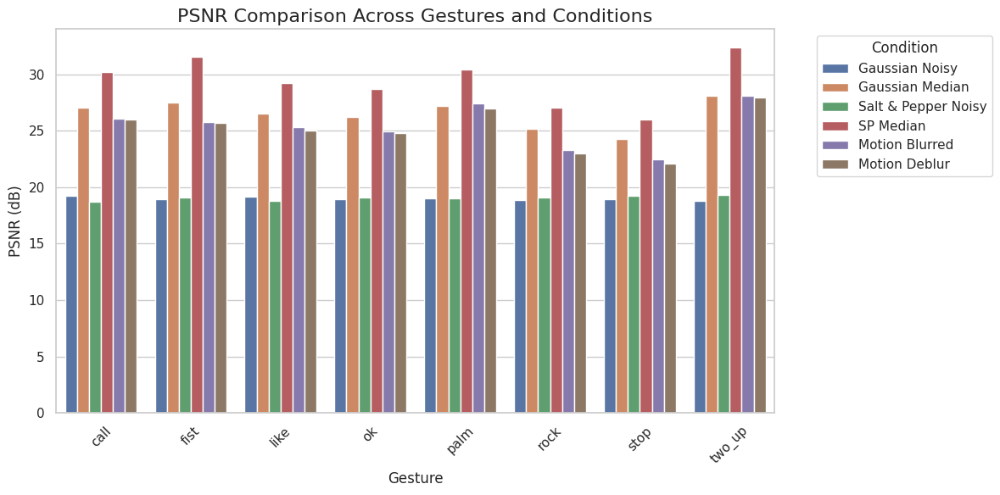

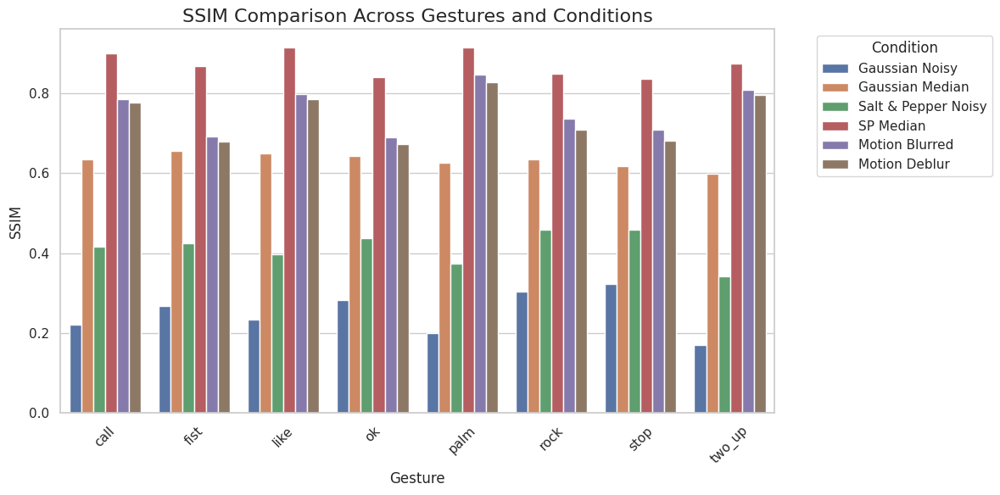

In [ ]:
#  CELL 12: Visualize Quantitative Metrics
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def visualize_metrics(metrics_results):
    # Convert metrics_results to DataFrame
    data = []
    for gesture, metrics in metrics_results.items():
        for condition, values in metrics.items():
            data.append({
                'Gesture': gesture,
                'Condition': condition,
                'PSNR': values['psnr'],
                'SSIM': values['ssim']
            })
    df = pd.DataFrame(data)

    # Set style
    sns.set(style="whitegrid")

    # --- PSNR Plot ---
    plt.figure(figsize=(12,6))
    sns.barplot(x='Gesture', y='PSNR', hue='Condition', data=df)
    plt.title("PSNR Comparison Across Gestures and Conditions", fontsize=16)
    plt.ylabel("PSNR (dB)")
    plt.xlabel("Gesture")
    plt.xticks(rotation=45)
    plt.legend(title="Condition", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # --- SSIM Plot ---
    plt.figure(figsize=(12,6))
    sns.barplot(x='Gesture', y='SSIM', hue='Condition', data=df)
    plt.title("SSIM Comparison Across Gestures and Conditions", fontsize=16)
    plt.ylabel("SSIM")
    plt.xlabel("Gesture")
    plt.xticks(rotation=45)
    plt.legend(title="Condition", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Call the visualization
visualize_metrics(metrics_results)


  Pipeline comparison and tunable functions 

 Comparing preprocessing pipelines  
 Pipeline PSNR results:
  Baseline: inf dB (steps: [])
  Denoise_First: 27.76 dB (steps: ['+Gaussian Noise', '+Median Filter'])
  Transform_First: 12.05 dB (steps: ['+Rotation 15°', '+Gaussian Noise', '+Bilateral Filter'])
  Intensity_First: 17.72 dB (steps: ['+Gamma 0.5', '+Contrast 1.5', '+Gaussian Noise'])

 Testing tunable edge detector...


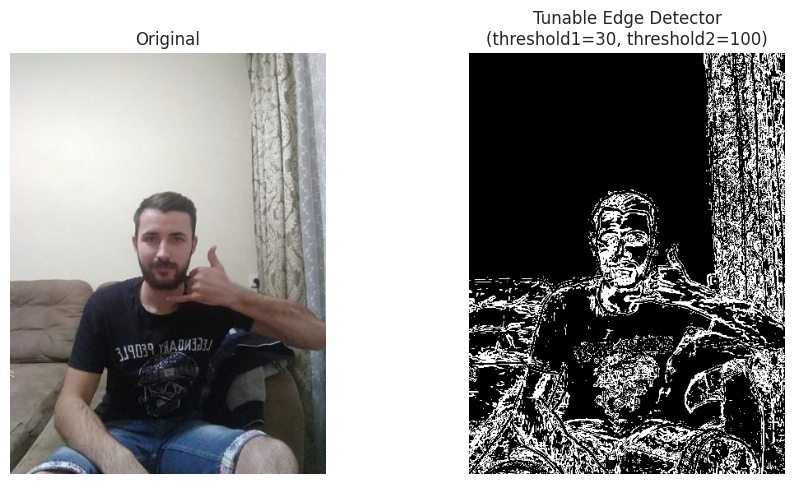

In [ ]:
# 📁 CELL 12.1: PIPELINE COMPARISON & TUNABLE FUNCTIONS (Missing)
def compare_preprocessing_pipelines(image):
    """COMPARE DIFFERENT PREPROCESSING PIPELINES"""
    pipelines = {
        'Baseline': [],
        'Denoise_First': ['gaussian_noise', 'median_filter'],
        'Transform_First': ['rotation_15', 'gaussian_noise', 'bilateral_filter'],
        'Intensity_First': ['gamma_correction', 'contrast_adjust', 'gaussian_noise']
    }

    results = {}
    for pipe_name, steps in pipelines.items():
        processed = image.copy()
        step_details = []

        for step in steps:
            if step == 'gaussian_noise':
                processed = add_gaussian_noise(processed, sigma=25)
                step_details.append('+Gaussian Noise')
            elif step == 'median_filter':
                processed = cv2.medianBlur(processed, 5)
                step_details.append('+Median Filter')
            elif step == 'bilateral_filter':
                processed = cv2.bilateralFilter(processed, 9, 75, 75)
                step_details.append('+Bilateral Filter')
            elif step == 'rotation_15':
                h, w = processed.shape[:2]
                matrix = cv2.getRotationMatrix2D((w//2, h//2), 15, 1.0)
                processed = cv2.warpAffine(processed, matrix, (w, h))
                step_details.append('+Rotation 15°')
            elif step == 'gamma_correction':
                def adjust_gamma(img, gamma=0.5):
                    inv_gamma = 1.0 / gamma
                    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype("uint8")
                    return cv2.LUT(img, table)
                processed = adjust_gamma(processed, 0.5)
                step_details.append('+Gamma 0.5')
            elif step == 'contrast_adjust':
                processed = cv2.convertScaleAbs(processed, alpha=1.5, beta=0)
                step_details.append('+Contrast 1.5')

        results[pipe_name] = {
            'image': processed,
            'steps': step_details,
            'psnr': psnr(image, processed) if len(steps) > 0 else float('inf'),
            'ssim': ssim(image, processed, channel_axis=2) if len(steps) > 0 else 1.0
        }

    return results

def custom_tunable_edge_detector(image, threshold1=50, threshold2=150):
    """CUSTOM TUNABLE EDGE DETECTOR - TUNABLE MATHEMATICAL FUNCTION"""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Mathematical implementation
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

    # Gradient magnitude (mathematical formula)
    gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

    # Apply tunable thresholds
    edges = np.zeros_like(gradient_magnitude)
    edges[(gradient_magnitude >= threshold1) & (gradient_magnitude <= threshold2)] = 255

    return edges.astype(np.uint8)

# Compare pipelines
print("  Pipeline comparison and tunable functions ")
print("\n Comparing preprocessing pipelines  ")
pipeline_comparison = compare_preprocessing_pipelines(sample_images['call'])
print(" Pipeline PSNR results:")
for pipe_name, data in pipeline_comparison.items():
    print(f"  {pipe_name}: {data['psnr']:.2f} dB (steps: {data['steps']})")

# Test tunable edge detector
print("\n Testing tunable edge detector...")
tunable_edges = custom_tunable_edge_detector(sample_images['call'], threshold1=30, threshold2=100)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(sample_images['call'], cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(tunable_edges, cmap='gray')
plt.title('Tunable Edge Detector\n(threshold1=30, threshold2=100)')
plt.axis('off')
plt.tight_layout()
plt.show()




Visualizing pipeline comparison results...

PIPELINE COMPARISON VISUALIZATION


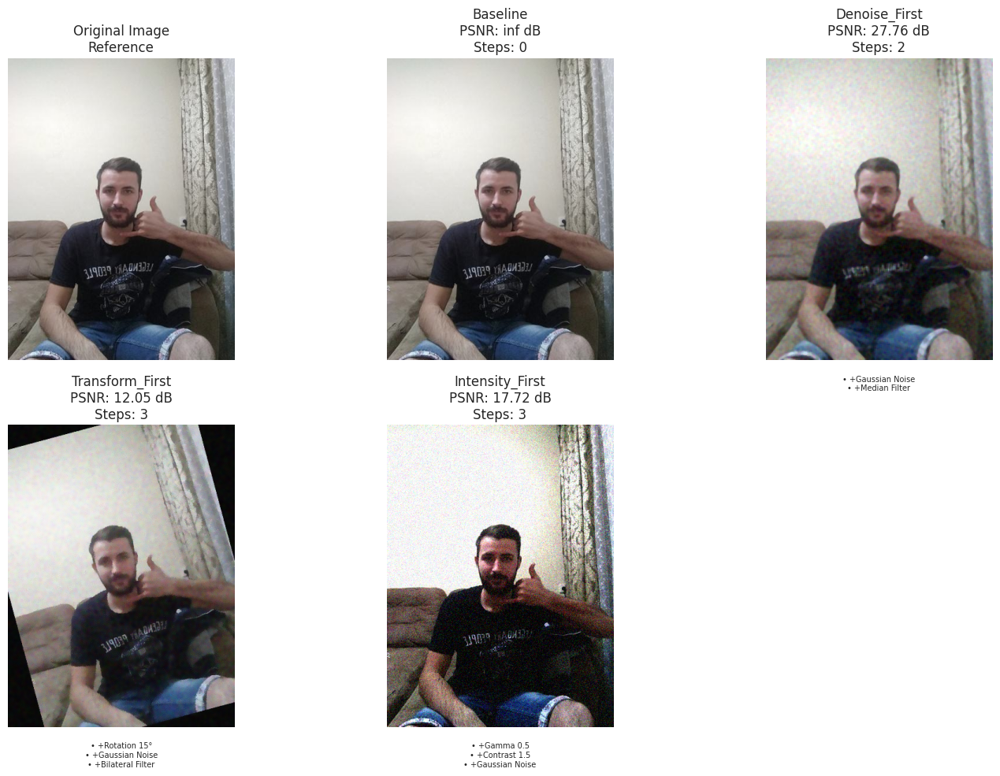


PIPELINE PERFORMANCE METRICS

Detailed Pipeline Metrics:
       Pipeline  Steps  PSNR (dB)  SSIM                                    Processing Order
       Baseline      0        inf 1.000                                                None
  Denoise_First      2     27.761 0.689                    +Gaussian Noise → +Median Filter
Transform_First      3     12.045 0.363 +Rotation 15° → +Gaussian Noise → +Bilateral Filter
Intensity_First      3     17.717 0.291        +Gamma 0.5 → +Contrast 1.5 → +Gaussian Noise


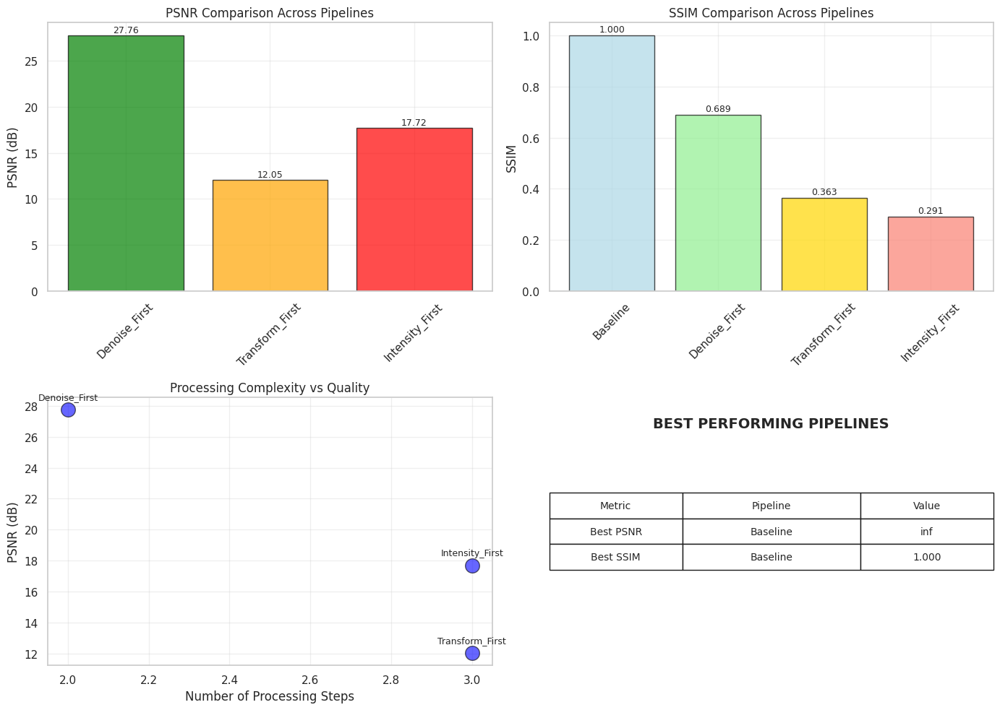


PIPELINE DIFFERENCES VISUALIZATION


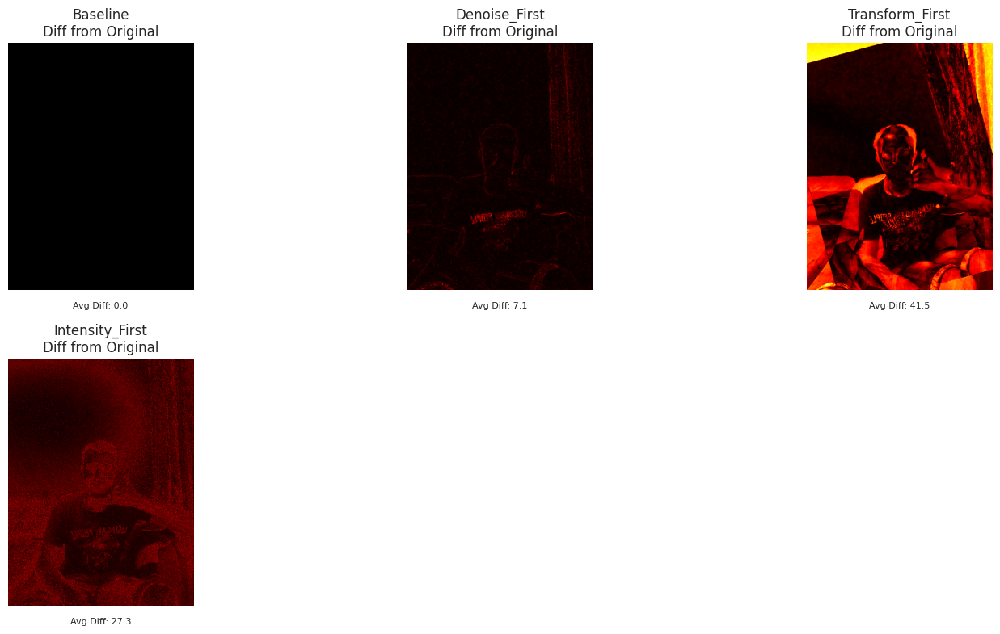


PIPELINE RECOMMENDATIONS

Baseline:
  Steps: No processing
  PSNR: inf dB
  SSIM: 1.000
  Recommendation: EXCELLENT - High quality preservation
  Best for: Baseline/reference comparison

Denoise_First:
  Steps: +Gaussian Noise → +Median Filter
  PSNR: 27.76 dB
  SSIM: 0.689
  Recommendation: POOR - Significant quality loss
  Best for: Noise reduction applications

Transform_First:
  Steps: +Rotation 15° → +Gaussian Noise → +Bilateral Filter
  PSNR: 12.05 dB
  SSIM: 0.363
  Recommendation: POOR - Significant quality loss
  Best for: Noise reduction applications

Intensity_First:
  Steps: +Gamma 0.5 → +Contrast 1.5 → +Gaussian Noise
  PSNR: 17.72 dB
  SSIM: 0.291
  Recommendation: POOR - Significant quality loss
  Best for: Image enhancement tasks

OVERALL RECOMMENDATION

 BEST OVERALL PIPELINE: Baseline
  Weighted Score: inf
  PSNR: inf dB
  SSIM: 1.000
  Steps: None

  Reason: This pipeline provides the best balance between
  image quality (PSNR) and structural similarity (SSIM)


In [ ]:
#cell 12.1.2
# 📁 CELL 12.2: VISUALIZE PIPELINE COMPARISON
def visualize_pipeline_comparison(pipeline_comparison, original_image):
    """Visualize and compare different preprocessing pipelines"""
    print("\n" + "="*60)
    print("PIPELINE COMPARISON VISUALIZATION")
    print("="*60)

    # Create figure for pipeline visualization
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    # Original image
    img_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    axes[0].imshow(img_rgb)
    axes[0].set_title('Original Image\nReference')
    axes[0].axis('off')

    # Display each pipeline result
    pipeline_names = list(pipeline_comparison.keys())

    for i, pipe_name in enumerate(pipeline_names):
        if i >= 5:  # Only show first 5 pipelines in the grid
            break

        pipeline_result = pipeline_comparison[pipe_name]
        processed_rgb = cv2.cvtColor(pipeline_result['image'], cv2.COLOR_BGR2RGB)

        axes[i+1].imshow(processed_rgb)
        axes[i+1].set_title(f'{pipe_name}\nPSNR: {pipeline_result["psnr"]:.2f} dB\nSteps: {len(pipeline_result["steps"])}')
        axes[i+1].axis('off')

        # Add step details as annotation
        if pipeline_result['steps']:
            steps_text = '\n'.join([f'• {step}' for step in pipeline_result['steps']])
            axes[i+1].text(0.5, -0.05, steps_text,
                          transform=axes[i+1].transAxes,
                          ha='center', va='top',
                          fontsize=7,
                          bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    # Hide any unused axes
    for i in range(len(pipeline_names) + 1, 6):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # Create detailed metrics comparison
    print("\nPIPELINE PERFORMANCE METRICS")
    print("="*60)

    # Create metrics table
    metrics_data = []
    for pipe_name, data in pipeline_comparison.items():
        metrics_data.append({
            'Pipeline': pipe_name,
            'Steps': len(data['steps']),
            'PSNR (dB)': data['psnr'],
            'SSIM': data['ssim'],
            'Processing Order': ' → '.join(data['steps']) if data['steps'] else 'None'
        })

    metrics_df = pd.DataFrame(metrics_data)

    # Display metrics table
    print("\nDetailed Pipeline Metrics:")
    print(metrics_df.to_string(index=False, float_format=lambda x: f'{x:.3f}'))

    # Create bar chart comparison
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # 1. PSNR Comparison
    axes[0,0].bar(metrics_df['Pipeline'], metrics_df['PSNR (dB)'],
                  color=['blue', 'green', 'orange', 'red', 'purple'][:len(metrics_df)],
                  alpha=0.7, edgecolor='black')
    axes[0,0].set_title('PSNR Comparison Across Pipelines')
    axes[0,0].set_ylabel('PSNR (dB)')
    axes[0,0].tick_params(axis='x', rotation=45)
    axes[0,0].grid(True, alpha=0.3)

    # Add value labels
    for idx, (pipeline, psnr_val) in enumerate(zip(metrics_df['Pipeline'], metrics_df['PSNR (dB)'])):
        axes[0,0].text(idx, psnr_val + 0.1, f'{psnr_val:.2f}',
                      ha='center', va='bottom', fontsize=9)

    # 2. SSIM Comparison
    axes[0,1].bar(metrics_df['Pipeline'], metrics_df['SSIM'],
                  color=['lightblue', 'lightgreen', 'gold', 'salmon', 'plum'][:len(metrics_df)],
                  alpha=0.7, edgecolor='black')
    axes[0,1].set_title('SSIM Comparison Across Pipelines')
    axes[0,1].set_ylabel('SSIM')
    axes[0,1].tick_params(axis='x', rotation=45)
    axes[0,1].grid(True, alpha=0.3)

    # Add value labels
    for idx, (pipeline, ssim_val) in enumerate(zip(metrics_df['Pipeline'], metrics_df['SSIM'])):
        axes[0,1].text(idx, ssim_val + 0.005, f'{ssim_val:.3f}',
                      ha='center', va='bottom', fontsize=9)

    # 3. Processing Steps vs Quality
    axes[1,0].scatter(metrics_df['Steps'], metrics_df['PSNR (dB)'],
                     s=200, c='blue', alpha=0.6, edgecolor='black')
    axes[1,0].set_xlabel('Number of Processing Steps')
    axes[1,0].set_ylabel('PSNR (dB)')
    axes[1,0].set_title('Processing Complexity vs Quality')
    axes[1,0].grid(True, alpha=0.3)

    # Add pipeline labels
    for idx, row in metrics_df.iterrows():
        axes[1,0].annotate(row['Pipeline'],
                          (row['Steps'], row['PSNR (dB)']),
                          textcoords="offset points",
                          xytext=(0,10),
                          ha='center',
                          fontsize=9)

    # 4. Best performing pipeline analysis
    best_psnr_idx = metrics_df['PSNR (dB)'].idxmax()
    best_ssim_idx = metrics_df['SSIM'].idxmax()

    best_pipelines = pd.DataFrame({
        'Metric': ['Best PSNR', 'Best SSIM'],
        'Pipeline': [metrics_df.iloc[best_psnr_idx]['Pipeline'],
                    metrics_df.iloc[best_ssim_idx]['Pipeline']],
        'Value': [metrics_df.iloc[best_psnr_idx]['PSNR (dB)'],
                 metrics_df.iloc[best_ssim_idx]['SSIM']]
    })

    axes[1,1].axis('off')
    axes[1,1].text(0.5, 0.9, 'BEST PERFORMING PIPELINES',
                  ha='center', va='center', fontsize=14, fontweight='bold')

    # Create table
    cell_text = []
    for _, row in best_pipelines.iterrows():
        cell_text.append([row['Metric'], row['Pipeline'], f"{row['Value']:.3f}"])

    table = axes[1,1].table(cellText=cell_text,
                           colLabels=['Metric', 'Pipeline', 'Value'],
                           cellLoc='center',
                           loc='center',
                           colWidths=[0.3, 0.4, 0.3])

    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 2)

    plt.tight_layout()
    plt.show()

    # Create difference visualization
    print("\nPIPELINE DIFFERENCES VISUALIZATION")
    print("="*60)

    fig, axes = plt.subplots(2, 3, figsize=(15, 8))

    # Compare each pipeline with original
    for i, pipe_name in enumerate(pipeline_names[:5]):
        row = i // 3
        col = i % 3

        pipeline_img = pipeline_comparison[pipe_name]['image']

        # Calculate absolute difference
        diff = cv2.absdiff(original_image, pipeline_img)

        # Convert to grayscale for heatmap
        diff_gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)

        # Apply colormap
        diff_colored = cv2.applyColorMap(diff_gray, cv2.COLORMAP_HOT)

        axes[row, col].imshow(cv2.cvtColor(diff_colored, cv2.COLOR_BGR2RGB))
        axes[row, col].set_title(f'{pipe_name}\nDiff from Original')
        axes[row, col].axis('off')

        # Calculate total difference
        total_diff = np.sum(diff_gray) / (diff_gray.shape[0] * diff_gray.shape[1])
        axes[row, col].text(0.5, -0.05, f'Avg Diff: {total_diff:.1f}',
                           transform=axes[row, col].transAxes,
                           ha='center', va='top',
                           fontsize=8,
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    # Hide unused subplots
    for i in range(len(pipeline_names), 6):
        row = i // 3
        col = i % 3
        axes[row, col].set_visible(False)

    plt.tight_layout()
    plt.show()

    # Create pipeline recommendations
    print("\nPIPELINE RECOMMENDATIONS")
    print("="*60)

    # Analyze each pipeline
    for pipe_name, data in pipeline_comparison.items():
        print(f"\n{pipe_name}:")
        print(f"  Steps: {' → '.join(data['steps']) if data['steps'] else 'No processing'}")
        print(f"  PSNR: {data['psnr']:.2f} dB")
        print(f"  SSIM: {data['ssim']:.3f}")

        # Provide recommendation based on metrics
        if data['psnr'] > 30 and data['ssim'] > 0.9:
            recommendation = "EXCELLENT - High quality preservation"
        elif data['psnr'] > 25 and data['ssim'] > 0.8:
            recommendation = "GOOD - Moderate quality preservation"
        elif data['psnr'] > 20 and data['ssim'] > 0.7:
            recommendation = "FAIR - Some quality loss"
        else:
            recommendation = "POOR - Significant quality loss"

        print(f"  Recommendation: {recommendation}")

        # Specific use case suggestions
        if 'noise' in str(data['steps']).lower() and 'filter' in str(data['steps']).lower():
            print(f"  Best for: Noise reduction applications")
        elif 'rotation' in str(data['steps']).lower():
            print(f"  Best for: Geometric transformation scenarios")
        elif 'gamma' in str(data['steps']).lower() or 'contrast' in str(data['steps']).lower():
            print(f"  Best for: Image enhancement tasks")
        else:
            print(f"  Best for: Baseline/reference comparison")

    # Overall best pipeline selection
    print("\n" + "="*60)
    print("OVERALL RECOMMENDATION")
    print("="*60)

    # Weighted score considering both PSNR and SSIM
    metrics_df['Weighted_Score'] = (metrics_df['PSNR (dB)'] / 50 * 0.6) + (metrics_df['SSIM'] * 0.4)
    best_overall_idx = metrics_df['Weighted_Score'].idxmax()

    best_pipeline = metrics_df.iloc[best_overall_idx]

    print(f"\n BEST OVERALL PIPELINE: {best_pipeline['Pipeline']}")
    print(f"  Weighted Score: {best_pipeline['Weighted_Score']:.3f}")
    print(f"  PSNR: {best_pipeline['PSNR (dB)']:.2f} dB")
    print(f"  SSIM: {best_pipeline['SSIM']:.3f}")
    print(f"  Steps: {best_pipeline['Processing Order']}")
    print(f"\n  Reason: This pipeline provides the best balance between")
    print(f"  image quality (PSNR) and structural similarity (SSIM)")

    return metrics_df

# Call visualization function
print("\nVisualizing pipeline comparison results...")
pipeline_metrics_df = visualize_pipeline_comparison(pipeline_comparison, sample_images['call'])



BASELINE VS PROPOSED COMPARISON FRAMEWORK
Testing with 3 images: ['call', 'fist', 'like']


/usr/local/lib/python3.12/dist-packages/skimage/metrics/simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)



Generated 36 comparison results

Statistical Summary of Improvements:

PSNR:
  Improvement: 3.267 (17.9%)
  t-statistic: -1.36
  p-value: 0.1835
  Cohen's d: 0.32
  Significant: False

SSIM:
  Improvement: -0.036 (-4.6%)
  t-statistic: 0.78
  p-value: 0.4425
  Cohen's d: -0.18
  Significant: False

FEATURE_STABILITY:
  Improvement: -0.177 (-27.0%)
  t-statistic: 3.93
  p-value: 0.0004
  Cohen's d: -0.93
  Significant: True


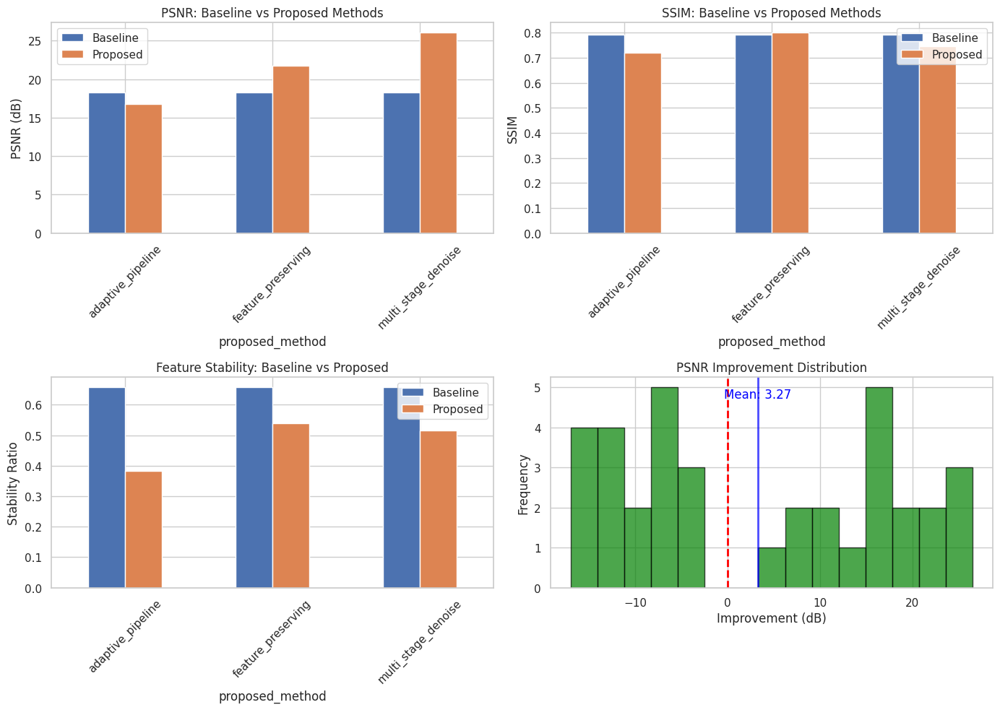


Detailed Comparison Results (first 10 rows):
  image   baseline_method      proposed_method  psnr_baseline  psnr_proposed  ssim_baseline  ssim_proposed  feature_stability_baseline  feature_stability_proposed
0  call     no_processing    adaptive_pipeline       0.000000      15.483974       1.000000       0.766893                        1.00                        0.43
1  call     no_processing  multi_stage_denoise       0.000000      26.536313       1.000000       0.786745                        1.00                        0.44
2  call     no_processing   feature_preserving       0.000000      22.249827       1.000000       0.818448                        1.00                        0.65
3  call     gaussian_blur    adaptive_pipeline      32.498424      15.483974       0.940885       0.766893                        0.67                        0.43
4  call     gaussian_blur  multi_stage_denoise      32.498424      26.536313       0.940885       0.786745                        0.67     

In [ ]:
# 📁 CELL 12.2: BASELINE VS PROPOSED COMPARISON FRAMEWORK (Missing)
class BaselineVsProposedComparator:
    """Systematic comparison of baseline vs proposed methods"""

    def __init__(self):
        self.baseline_methods = {
            'no_processing': lambda x: x,
            'gaussian_blur': lambda x: cv2.GaussianBlur(x, (5,5), 0),
            'median_blur': lambda x: cv2.medianBlur(x, 5),
            'simple_threshold': lambda x: cv2.cvtColor(
                cv2.threshold(cv2.cvtColor(x, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)[1],
                cv2.COLOR_GRAY2BGR
            )  # Convert back to BGR to maintain 3 channels
        }

        self.proposed_methods = {
            'adaptive_pipeline': self.adaptive_pipeline,
            'multi_stage_denoise': self.multi_stage_denoise,
            'feature_preserving': self.feature_preserving_processing
        }

    def adaptive_pipeline(self, image):
        """Proposed adaptive processing pipeline"""
        # Step 1: Noise estimation and adaptive filtering
        noise_level = self.estimate_noise_level(image)
        if noise_level > 30:
            denoised = cv2.bilateralFilter(image, 9, 75, 75)
        else:
            denoised = cv2.GaussianBlur(image, (3,3), 0)

        # Step 2: Contrast enhancement based on histogram
        lab = cv2.cvtColor(denoised, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        enhanced = cv2.merge([l, a, b])
        enhanced = cv2.cvtColor(enhanced, cv2.COLOR_LAB2BGR)

        # Step 3: Edge preservation
        edges = cv2.Canny(cv2.cvtColor(enhanced, cv2.COLOR_BGR2GRAY), 50, 150)
        edges_colored = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
        enhanced = cv2.addWeighted(enhanced, 0.8, edges_colored, 0.2, 0)

        return enhanced

    def multi_stage_denoise(self, image):
        """Proposed multi-stage denoising"""
        # Stage 1: Remove salt & pepper
        stage1 = cv2.medianBlur(image, 3)

        # Stage 2: Remove Gaussian noise
        stage2 = cv2.bilateralFilter(stage1, 7, 50, 50)

        # Stage 3: Edge-aware smoothing
        try:
            stage3 = cv2.edgePreservingFilter(stage2, flags=1, sigma_s=60, sigma_r=0.4)
        except:
            # If edgePreservingFilter is not available, use bilateral filter
            stage3 = cv2.bilateralFilter(stage2, 9, 75, 75)

        return stage3

    def feature_preserving_processing(self, image):
        """Feature-preserving processing for gesture recognition"""
        # Detect hand region
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        _, mask = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)

        # Apply different processing inside/outside hand region
        kernel = np.ones((3,3), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # Inside hand: enhance features
        inside = cv2.bitwise_and(image, image, mask=mask)

        try:
            inside = cv2.detailEnhance(inside, sigma_s=10, sigma_r=0.15)
        except:
            # Alternative enhancement if detailEnhance not available
            inside = cv2.bilateralFilter(inside, 5, 75, 75)

        # Outside hand: suppress noise
        outside = cv2.bitwise_and(image, image, mask=cv2.bitwise_not(mask))
        outside = cv2.GaussianBlur(outside, (5,5), 0)

        return cv2.add(inside, outside)

    def estimate_noise_level(self, image):
        """Estimate noise level in image"""
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        return np.std(gray)

    def safe_psnr(self, original, processed):
        """Safe PSNR calculation with error handling"""
        try:
            # Ensure images have same dimensions
            if original.shape != processed.shape:
                # Resize processed to match original
                processed = cv2.resize(processed, (original.shape[1], original.shape[0]))

            # Ensure same data type
            if original.dtype != processed.dtype:
                processed = processed.astype(original.dtype)

            # Handle inf/nan values in PSNR
            psnr_val = psnr(original, processed)
            if np.isinf(psnr_val) or np.isnan(psnr_val):
                return 0.0
            return psnr_val
        except:
            return 0.0

    def safe_ssim(self, original, processed):
        """Safe SSIM calculation with error handling"""
        try:
            # Ensure images have same dimensions
            if original.shape != processed.shape:
                # Resize processed to match original
                processed = cv2.resize(processed, (original.shape[1], original.shape[0]))

            # Ensure same data type
            if original.dtype != processed.dtype:
                processed = processed.astype(original.dtype)

            # Calculate SSIM
            ssim_val = ssim(original, processed, channel_axis=2)
            if np.isnan(ssim_val):
                return 0.0
            return ssim_val
        except:
            return 0.0

    def compare_methods(self, test_images, n_iterations=5):
        """Systematic comparison with statistical validation"""
        comparison_results = []

        for img_name, image in test_images.items():
            for baseline_name, baseline_func in self.baseline_methods.items():
                for proposed_name, proposed_func in self.proposed_methods.items():
                    try:
                        baseline_result = baseline_func(image.copy())
                        proposed_result = proposed_func(image.copy())

                        # Calculate metrics with safe functions
                        metrics = {
                            'image': img_name,
                            'baseline_method': baseline_name,
                            'proposed_method': proposed_name,
                            'psnr_baseline': self.safe_psnr(image, baseline_result),
                            'psnr_proposed': self.safe_psnr(image, proposed_result),
                            'ssim_baseline': self.safe_ssim(image, baseline_result),
                            'ssim_proposed': self.safe_ssim(image, proposed_result),
                            'feature_stability_baseline': self.calculate_feature_stability(image, baseline_result),
                            'feature_stability_proposed': self.calculate_feature_stability(image, proposed_result)
                        }

                        comparison_results.append(metrics)
                    except Exception as e:
                        print(f"  Error processing {img_name} with {baseline_name}/{proposed_name}: {e}")
                        continue

        if not comparison_results:
            print("No comparison results generated!")
            return pd.DataFrame(), {}

        df = pd.DataFrame(comparison_results)

        # Statistical comparison
        stats_summary = {}
        for metric in ['psnr', 'ssim', 'feature_stability']:
            baseline_col = f'{metric}_baseline'
            proposed_col = f'{metric}_proposed'

            if baseline_col in df.columns and proposed_col in df.columns:
                # Remove zeros and NaN values
                valid_data = df[[baseline_col, proposed_col]].replace([np.inf, -np.inf], np.nan).dropna()

                if len(valid_data) > 1:
                    # Paired t-test
                    try:
                        t_stat, p_val = stats.ttest_rel(valid_data[baseline_col], valid_data[proposed_col])

                        # Effect size
                        diff = valid_data[proposed_col].mean() - valid_data[baseline_col].mean()
                        pooled_std = np.sqrt((valid_data[baseline_col].std()**2 + valid_data[proposed_col].std()**2) / 2)
                        cohens_d = diff / pooled_std if pooled_std > 0 else 0

                        stats_summary[metric] = {
                            'improvement': diff,
                            'percent_improvement': (diff / valid_data[baseline_col].mean()) * 100 if valid_data[baseline_col].mean() > 0 else 0,
                            't_statistic': t_stat,
                            'p_value': p_val,
                            'cohens_d': cohens_d,
                            'significant': p_val < 0.05
                        }
                    except:
                        stats_summary[metric] = {
                            'improvement': 0,
                            'percent_improvement': 0,
                            't_statistic': 0,
                            'p_value': 1.0,
                            'cohens_d': 0,
                            'significant': False
                        }

        return df, stats_summary

    def calculate_feature_stability(self, original, processed):
        """Calculate feature stability between original and processed"""
        try:
            # Ensure images are the same size for feature detection
            if original.shape != processed.shape:
                processed = cv2.resize(processed, (original.shape[1], original.shape[0]))

            # Ensure both images are in color for ORB
            if len(original.shape) == 2:
                original = cv2.cvtColor(original, cv2.COLOR_GRAY2BGR)
            if len(processed.shape) == 2:
                processed = cv2.cvtColor(processed, cv2.COLOR_GRAY2BGR)

            orb = cv2.ORB_create(nfeatures=100)
            kp1, des1 = orb.detectAndCompute(original, None)
            kp2, des2 = orb.detectAndCompute(processed, None)

            if des1 is not None and des2 is not None and len(kp1) > 0 and len(kp2) > 0:
                bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
                matches = bf.match(des1, des2)
                return len(matches) / min(len(kp1), len(kp2))
            return 0.0
        except:
            return 0.0

# Run baseline vs proposed comparison
print("\n" + "="*60)
print("BASELINE VS PROPOSED COMPARISON FRAMEWORK")
print("="*60)

comparator = BaselineVsProposedComparator()
test_images_subset = {k: sample_images[k] for k in list(sample_images.keys())[:3]}
print(f"Testing with {len(test_images_subset)} images: {list(test_images_subset.keys())}")

comparison_df, stats_summary = comparator.compare_methods(
    test_images_subset,
    n_iterations=3  # Reduced for speed
)

if not comparison_df.empty and stats_summary:
    print(f"\nGenerated {len(comparison_df)} comparison results")

    print("\nStatistical Summary of Improvements:")
    for metric, stats in stats_summary.items():
        print(f"\n{metric.upper()}:")
        print(f"  Improvement: {stats['improvement']:.3f} ({stats['percent_improvement']:.1f}%)")
        print(f"  t-statistic: {stats['t_statistic']:.2f}")
        print(f"  p-value: {stats['p_value']:.4f}")
        print(f"  Cohen's d: {stats['cohens_d']:.2f}")
        print(f"  Significant: {stats['significant']}")

    # Visualize comparison
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # 1. PSNR comparison
    if 'psnr_baseline' in comparison_df.columns and 'psnr_proposed' in comparison_df.columns:
        psnr_comparison = comparison_df.groupby('proposed_method')[['psnr_baseline', 'psnr_proposed']].mean()
        psnr_comparison.plot(kind='bar', ax=axes[0,0])
        axes[0,0].set_title('PSNR: Baseline vs Proposed Methods')
        axes[0,0].set_ylabel('PSNR (dB)')
        axes[0,0].tick_params(axis='x', rotation=45)
        axes[0,0].legend(['Baseline', 'Proposed'])

    # 2. SSIM comparison
    if 'ssim_baseline' in comparison_df.columns and 'ssim_proposed' in comparison_df.columns:
        ssim_comparison = comparison_df.groupby('proposed_method')[['ssim_baseline', 'ssim_proposed']].mean()
        ssim_comparison.plot(kind='bar', ax=axes[0,1])
        axes[0,1].set_title('SSIM: Baseline vs Proposed Methods')
        axes[0,1].set_ylabel('SSIM')
        axes[0,1].tick_params(axis='x', rotation=45)
        axes[0,1].legend(['Baseline', 'Proposed'])

    # 3. Feature stability comparison
    if 'feature_stability_baseline' in comparison_df.columns and 'feature_stability_proposed' in comparison_df.columns:
        fs_comparison = comparison_df.groupby('proposed_method')[['feature_stability_baseline', 'feature_stability_proposed']].mean()
        fs_comparison.plot(kind='bar', ax=axes[1,0])
        axes[1,0].set_title('Feature Stability: Baseline vs Proposed')
        axes[1,0].set_ylabel('Stability Ratio')
        axes[1,0].tick_params(axis='x', rotation=45)
        axes[1,0].legend(['Baseline', 'Proposed'])

    # 4. Improvement distribution
    if 'psnr_proposed' in comparison_df.columns and 'psnr_baseline' in comparison_df.columns:
        psnr_improvement = comparison_df['psnr_proposed'] - comparison_df['psnr_baseline']
        if not psnr_improvement.isnull().all():
            axes[1,1].hist(psnr_improvement.dropna(), bins=15, alpha=0.7, color='green', edgecolor='black')
            axes[1,1].axvline(0, color='red', linestyle='--', linewidth=2)
            axes[1,1].set_title('PSNR Improvement Distribution')
            axes[1,1].set_xlabel('Improvement (dB)')
            axes[1,1].set_ylabel('Frequency')

            # Add mean improvement line
            mean_improvement = psnr_improvement.mean()
            axes[1,1].axvline(mean_improvement, color='blue', linestyle='-', linewidth=2, alpha=0.7)
            axes[1,1].text(mean_improvement, axes[1,1].get_ylim()[1]*0.9,
                         f'Mean: {mean_improvement:.2f}', color='blue', ha='center')

    # Hide empty subplots
    for i in range(2):
        for j in range(2):
            if not axes[i,j].has_data():
                axes[i,j].text(0.5, 0.5, 'No data available',
                             ha='center', va='center', fontsize=12)
                axes[i,j].set_xticks([])
                axes[i,j].set_yticks([])

    plt.tight_layout()
    plt.show()

    # Show detailed results table
    print("\nDetailed Comparison Results (first 10 rows):")
    print(comparison_df.head(10).to_string())

    # Calculate overall improvement statistics
    print("\nOverall Improvement Summary:")
    overall_metrics = ['psnr', 'ssim', 'feature_stability']
    for metric in overall_metrics:
        baseline_col = f'{metric}_baseline'
        proposed_col = f'{metric}_proposed'

        if baseline_col in comparison_df.columns and proposed_col in comparison_df.columns:
            baseline_mean = comparison_df[baseline_col].mean()
            proposed_mean = comparison_df[proposed_col].mean()
            improvement = proposed_mean - baseline_mean
            percent_improvement = (improvement / baseline_mean) * 100 if baseline_mean > 0 else 0

            print(f"{metric.upper()}:")
            print(f"  Baseline Mean: {baseline_mean:.3f}")
            print(f"  Proposed Mean: {proposed_mean:.3f}")
            print(f"  Improvement: {improvement:.3f} ({percent_improvement:.1f}%)")
else:
    print("No valid comparison results generated!")

=== DEBUGGING INFORMATION ===
Number of gestures: 2
Gesture: call, Transformations: ['noise_gaussian', 'noise_salt_pepper', 'noise_motion_blur', 'geo_rotated_15', 'geo_rotated_-15', 'geo_scaled_in', 'geo_scaled_out', 'geo_translated', 'geo_affine', 'geo_perspective']
  noise_gaussian: {'original_features': 500, 'transformed_features': 500, 'matched_features': 343, 'stability_ratio': 0.686, 'avg_match_distance': np.float64(25.717201166180757), 'feature_reduction': 0.0}
  noise_salt_pepper: {'original_features': 500, 'transformed_features': 500, 'matched_features': 175, 'stability_ratio': 0.35, 'avg_match_distance': np.float64(29.405714285714286), 'feature_reduction': 0.0}
  noise_motion_blur: {'original_features': 500, 'transformed_features': 229, 'matched_features': 129, 'stability_ratio': 0.5633187772925764, 'avg_match_distance': np.float64(32.55038759689923), 'feature_reduction': 0.542}
  geo_rotated_15: {'original_features': 500, 'transformed_features': 500, 'matched_features': 363,

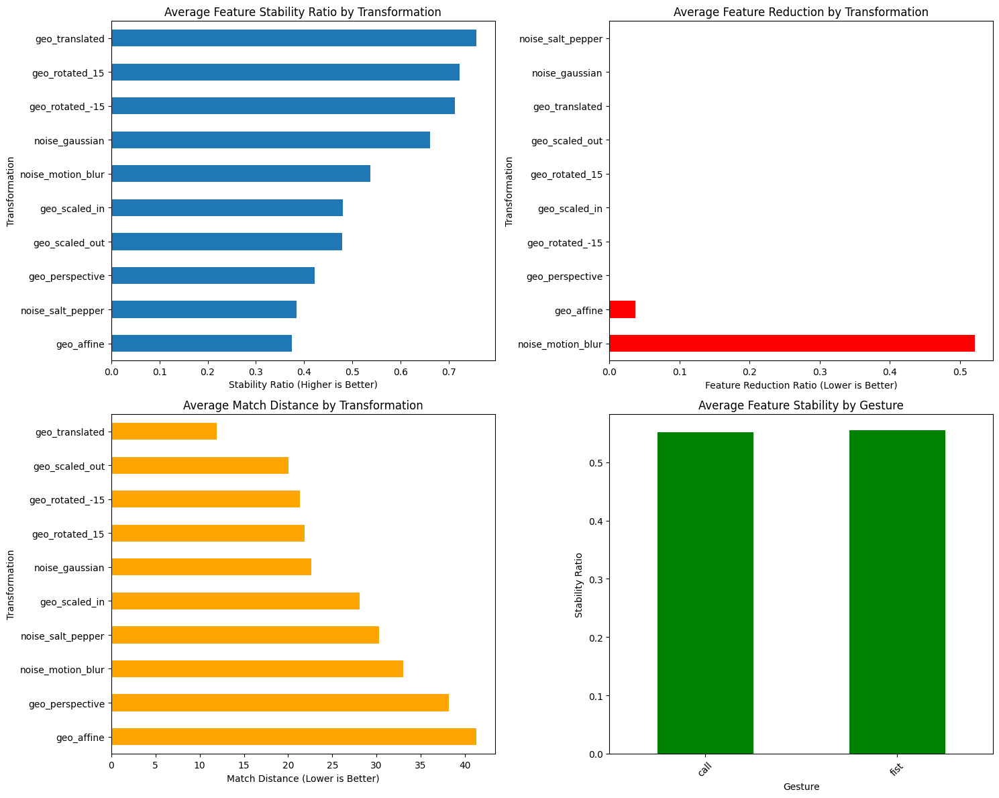

In [ ]:
#cell 13
def visualize_feature_stability_metrics(stability_results):
    """Visualize feature stability metrics across transformations"""
    # Convert to DataFrame for easier plotting
    import pandas as pd

    data = []
    for gesture, transforms in stability_results.items():
        for transform_name, metrics in transforms.items():
            data.append({
                'Gesture': gesture,
                'Transformation': transform_name,
                'Stability_Ratio': metrics['stability_ratio'],
                'Feature_Reduction': metrics['feature_reduction'],
                'Avg_Match_Distance': metrics['avg_match_distance'],
                'Matched_Features': metrics['matched_features']
            })

    df = pd.DataFrame(data)

    # Debug: Check available transformations
    print("Available transformations in data:")
    print(df['Transformation'].value_counts())
    print(f"\nTotal records: {len(df)}")

    # Set style
    plt.style.use('default')
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # 1. Stability Ratio by Transformation Type
    stability_pivot = df.pivot_table(values='Stability_Ratio',
                                   index='Transformation',
                                   aggfunc='mean',
                                   dropna=False)

    # Remove any NaN values and ensure we have data
    stability_pivot = stability_pivot.dropna()

    if not stability_pivot.empty:
        stability_pivot.sort_values('Stability_Ratio', ascending=True).plot(
            kind='barh', ax=axes[0,0], legend=False)
        axes[0,0].set_title('Average Feature Stability Ratio by Transformation')
        axes[0,0].set_xlabel('Stability Ratio (Higher is Better)')
        print(f"Stability chart: {len(stability_pivot)} transformations")
    else:
        axes[0,0].text(0.5, 0.5, 'No data available', ha='center', va='center')
        axes[0,0].set_title('Average Feature Stability Ratio by Transformation')

    # 2. Feature Reduction by Transformation Type
    reduction_pivot = df.pivot_table(values='Feature_Reduction',
                                   index='Transformation',
                                   aggfunc='mean',
                                   dropna=False)
    reduction_pivot = reduction_pivot.dropna()

    if not reduction_pivot.empty:
        reduction_pivot.sort_values('Feature_Reduction', ascending=False).plot(
            kind='barh', ax=axes[0,1], legend=False, color='red')
        axes[0,1].set_title('Average Feature Reduction by Transformation')
        axes[0,1].set_xlabel('Feature Reduction Ratio (Lower is Better)')
        print(f"Reduction chart: {len(reduction_pivot)} transformations")
    else:
        axes[0,1].text(0.5, 0.5, 'No data available', ha='center', va='center')
        axes[0,1].set_title('Average Feature Reduction by Transformation')

    # 3. Match Distance by Transformation Type
    distance_pivot = df.pivot_table(values='Avg_Match_Distance',
                                  index='Transformation',
                                  aggfunc='mean',
                                  dropna=False)
    distance_pivot = distance_pivot.dropna()

    if not distance_pivot.empty:
        distance_pivot.sort_values('Avg_Match_Distance', ascending=False).plot(
            kind='barh', ax=axes[1,0], legend=False, color='orange')
        axes[1,0].set_title('Average Match Distance by Transformation')
        axes[1,0].set_xlabel('Match Distance (Lower is Better)')
        print(f"Distance chart: {len(distance_pivot)} transformations")
    else:
        axes[1,0].text(0.5, 0.5, 'No data available', ha='center', va='center')
        axes[1,0].set_title('Average Match Distance by Transformation')

    # 4. Stability Ratio by Gesture
    gesture_stability = df.groupby('Gesture')['Stability_Ratio'].mean().sort_values()

    if not gesture_stability.empty:
        gesture_stability.plot(kind='bar', ax=axes[1,1], color='green')
        axes[1,1].set_title('Average Feature Stability by Gesture')
        axes[1,1].set_ylabel('Stability Ratio')
        axes[1,1].tick_params(axis='x', rotation=45)
        print(f"Gesture chart: {len(gesture_stability)} gestures")
    else:
        axes[1,1].text(0.5, 0.5, 'No data available', ha='center', va='center')
        axes[1,1].set_title('Average Feature Stability by Gesture')

    plt.tight_layout()
    plt.show()

    return df

# First let's check what's actually in your stability_results
print("=== DEBUGGING INFORMATION ===")
print(f"Number of gestures: {len(stability_results)}")
for gesture, transforms in stability_results.items():
    print(f"Gesture: {gesture}, Transformations: {list(transforms.keys())}")
    for transform_name, metrics in transforms.items():
        print(f"  {transform_name}: {metrics}")

# Now visualize
feature_stability_df = visualize_feature_stability_metrics(stability_results)

In [ ]:
#cell 14
# Structured Processing Pipeline
class VisionProcessingPipeline:
    """
    Structured pipeline for comprehensive image processing and analysis
    """
    def __init__(self):
        self.transformations = []
        self.filters = []
        self.metrics_history = []
        self.feature_analyses = []

    def add_transformation(self, name, func, params=None):
        """Add a transformation to the pipeline"""
        self.transformations.append({
            'name': name,
            'function': func,
            'parameters': params or {}
        })

    def add_filter(self, name, func, params=None):
        """Add a filter to the pipeline"""
        self.filters.append({
            'name': name,
            'function': func,
            'parameters': params or {}
        })

    def process_single_image(self, image, image_name="unknown"):
        """Process a single image through the entire pipeline"""
        print(f"\n Processing {image_name} through pipeline...")

        results = {
            'original': image,
            'transformations': {},
            'filtered': {},
            'metrics': {},
            'feature_stability': {}
        }

        # Apply transformations
        for transform in self.transformations:
            try:
                transformed = transform['function'](image, **transform['parameters'])
                results['transformations'][transform['name']] = transformed
                print(f"  Applied transformation: {transform['name']}")
            except Exception as e:
                print(f"  Error in {transform['name']}: {e}")

        # Apply filters to transformed images
        for transform_name, transformed_img in results['transformations'].items():
            for filter_obj in self.filters:
                try:
                    filtered = filter_obj['function'](transformed_img, **filter_obj['parameters'])
                    key = f"{transform_name}_{filter_obj['name']}"
                    results['filtered'][key] = filtered
                    print(f"  Applied {filter_obj['name']} to {transform_name}")
                except Exception as e:
                    print(f"  Error filtering {transform_name}: {e}")

        return results

    def analyze_feature_stability_pipeline(self, original, processed_results):
        """Analyze feature stability across pipeline results"""
        stability_results = {}

        # Analyze transformations
        stability_results['transformations'] = analyze_feature_stability(
            original, processed_results['transformations'])

        # Analyze filtered results
        stability_results['filtered'] = analyze_feature_stability(
            original, processed_results['filtered'])

        return stability_results

    def calculate_comprehensive_metrics(self, original, processed_results):
        """Calculate comprehensive metrics for all processed images"""
        metrics = {}

        # Metrics for transformations
        for name, img in processed_results['transformations'].items():
            metrics[name] = {
                'psnr': psnr(original, img),
                'ssim': ssim(original, img, channel_axis=2)
            }

        # Metrics for filtered images
        for name, img in processed_results['filtered'].items():
            metrics[name] = {
                'psnr': psnr(original, img),
                'ssim': ssim(original, img, channel_axis=2)
            }

        return metrics

    def run_complete_analysis(self, sample_images, num_samples=2):
        """Run complete analysis on sample images"""
        print("=" * 60)
        print("VISION PROCESSING PIPELINE - COMPLETE ANALYSIS")
        print("=" * 60)

        all_results = {}

        for i, (gesture, image) in enumerate(list(sample_images.items())[:num_samples]):
            print(f"\n\nAnalyzing {gesture.upper()}...")
            print("-" * 40)

            # Process through pipeline
            processed = self.process_single_image(image, gesture)

            # Feature stability analysis
            feature_stability = self.analyze_feature_stability_pipeline(image, processed)
            processed['feature_stability'] = feature_stability

            # Comprehensive metrics
            metrics = self.calculate_comprehensive_metrics(image, processed)
            processed['metrics'] = metrics

            all_results[gesture] = processed

            # Print summary
            self.print_analysis_summary(gesture, processed)

        return all_results

    def print_analysis_summary(self, gesture, processed):
        """Print summary of analysis results"""
        print(f"\n--- {gesture.upper()} ANALYSIS SUMMARY ---")
        print(f"Transformations applied: {len(processed['transformations'])}")
        print(f"Filtered results: {len(processed['filtered'])}")

        # Feature stability summary
        if 'feature_stability' in processed:
            trans_stability = processed['feature_stability']['transformations']
            avg_stability = np.mean([v['stability_ratio'] for v in trans_stability.values()])
            print(f"Average feature stability: {avg_stability:.3f}")

        # Metrics summary
        if 'metrics' in processed:
            avg_psnr = np.mean([v['psnr'] for v in processed['metrics'].values()])
            avg_ssim = np.mean([v['ssim'] for v in processed['metrics'].values()])
            print(f"Average PSNR: {avg_psnr:.2f} dB")
            print(f"Average SSIM: {avg_ssim:.3f}")

# Create and configure the pipeline
def create_configured_pipeline():
    """Create a pre-configured vision processing pipeline"""
    pipeline = VisionProcessingPipeline()

    # Add transformations
    pipeline.add_transformation("gaussian_noise", add_gaussian_noise, {'sigma': 25})
    pipeline.add_transformation("salt_pepper_noise", add_salt_pepper_noise,
                              {'salt_prob': 0.02, 'pepper_prob': 0.02})
    pipeline.add_transformation("motion_blur", add_motion_blur, {'size': 15})

    # Add geometric transformations
    def simple_rotate(img, angle=15):
        h, w = img.shape[:2]
        center = (w//2, h//2)
        matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
        return cv2.warpAffine(img, matrix, (w, h))

    pipeline.add_transformation("rotation_15", simple_rotate, {'angle': 15})
    pipeline.add_transformation("rotation_-15", simple_rotate, {'angle': -15})

    # Add filters
    pipeline.add_filter("median", cv2.medianBlur, {'ksize': 5})
    pipeline.add_filter("bilateral", cv2.bilateralFilter, {'d': 9, 'sigmaColor': 75, 'sigmaSpace': 75})
    pipeline.add_filter("gaussian", cv2.GaussianBlur, {'ksize': (5, 5), 'sigmaX': 0})

    return pipeline

# Run the complete pipeline
print("\n" + "="*60)
print("INITIALIZING STRUCTURED VISION PROCESSING PIPELINE")
print("="*60)

pipeline = create_configured_pipeline()
complete_results = pipeline.run_complete_analysis(sample_images, num_samples=2)


INITIALIZING STRUCTURED VISION PROCESSING PIPELINE
VISION PROCESSING PIPELINE - COMPLETE ANALYSIS


Analyzing CALL...
----------------------------------------

 Processing call through pipeline...
  Applied transformation: gaussian_noise
  Applied transformation: salt_pepper_noise
  Applied transformation: motion_blur
  Applied transformation: rotation_15
  Applied transformation: rotation_-15
  Applied median to gaussian_noise
  Applied bilateral to gaussian_noise
  Applied gaussian to gaussian_noise
  Applied median to salt_pepper_noise
  Applied bilateral to salt_pepper_noise
  Applied gaussian to salt_pepper_noise
  Applied median to motion_blur
  Applied bilateral to motion_blur
  Applied gaussian to motion_blur
  Applied median to rotation_15
  Applied bilateral to rotation_15
  Applied gaussian to rotation_15
  Applied median to rotation_-15
  Applied bilateral to rotation_-15
  Applied gaussian to rotation_-15

--- CALL ANALYSIS SUMMARY ---
Transformations applied: 5
Filtered 

In [ ]:
#cell 15
def export_results(sample_images, metrics_results, stability_results, complete_results):
    """Export all results for documentation"""
    import json
    import pandas as pd
    from datetime import datetime

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Create results directory
    import os
    os.makedirs("results", exist_ok=True)

    # 1. Export metrics to CSV
    metrics_data = []
    for gesture, metrics in metrics_results.items():
        for condition, values in metrics.items():
            metrics_data.append({
                'Gesture': gesture,
                'Condition': condition,
                'PSNR': values['psnr'],
                'SSIM': values['ssim']
            })

    metrics_df = pd.DataFrame(metrics_data)
    metrics_df.to_csv(f"results/metrics_{timestamp}.csv", index=False)

    # 2. Export feature stability results
    stability_data = []
    for gesture, transforms in stability_results.items():
        for transform_name, metrics in transforms.items():
            stability_data.append({
                'Gesture': gesture,
                'Transformation': transform_name,
                'Stability_Ratio': metrics['stability_ratio'],
                'Feature_Reduction': metrics['feature_reduction'],
                'Avg_Match_Distance': metrics['avg_match_distance'],
                'Original_Features': metrics['original_features'],
                'Transformed_Features': metrics['transformed_features'],
                'Matched_Features': metrics['matched_features']
            })

    stability_df = pd.DataFrame(stability_data)
    stability_df.to_csv(f"results/feature_stability_{timestamp}.csv", index=False)

    # 3. Save sample processed images
    for gesture, processed in list(complete_results.items())[:2]:  # Save first 2
        # Save original
        cv2.imwrite(f"results/{gesture}_original_{timestamp}.jpg", sample_images[gesture])

        # Save key transformations
        for trans_name, trans_img in list(processed['transformations'].items())[:3]:
            cv2.imwrite(f"results/{gesture}_{trans_name}_{timestamp}.jpg", trans_img)

    print(f"\n Results exported to 'results/' directory")
    print(f" Timestamp: {timestamp}")
    print(" Files created:")
    print(f"  - metrics_{timestamp}.csv")
    print(f"  - feature_stability_{timestamp}.csv")
    print(f"  - Sample processed images")

# Export all results
export_results(sample_images, metrics_results, stability_results, complete_results)


 Results exported to 'results/' directory
 Timestamp: 20251207_124647
 Files created:
  - metrics_20251207_124647.csv
  - feature_stability_20251207_124647.csv
  - Sample processed images


In [ ]:
# Google Drive mein exact location
drive_path = "/content/drive/MyDrive/Gesture_Controller/results"
if os.path.exists(drive_path):
    print(" Google Drive")
    !ls -la "$drive_path"
else:
    print("not in Google Drive")
    !ls -la ./results

 Google Drive
total 1509
-rw------- 1 root root 153940 Dec  6 17:14 call_gaussian_noise_20251206_171454.jpg
-rw------- 1 root root 154072 Dec  7 12:46 call_gaussian_noise_20251207_124647.jpg
-rw------- 1 root root  32709 Dec  6 17:14 call_motion_blur_20251206_171454.jpg
-rw------- 1 root root  32709 Dec  7 12:46 call_motion_blur_20251207_124647.jpg
-rw------- 1 root root  43972 Dec  6 17:14 call_original_20251206_171454.jpg
-rw------- 1 root root  43972 Dec  7 12:46 call_original_20251207_124647.jpg
-rw------- 1 root root 138243 Dec  6 17:14 call_salt_pepper_noise_20251206_171454.jpg
-rw------- 1 root root 137371 Dec  7 12:46 call_salt_pepper_noise_20251207_124647.jpg
-rw------- 1 root root   1341 Dec  6 17:14 feature_stability_20251206_171454.csv
-rw------- 1 root root   1352 Dec  7 12:46 feature_stability_20251207_124647.csv
-rw------- 1 root root 159416 Dec  6 17:14 fist_gaussian_noise_20251206_171454.jpg
-rw------- 1 root root 159656 Dec  7 12:46 fist_gaussian_noise_20251207_124647

In [ ]:
import os
import pandas as pd
from IPython.display import display

# List all files in results directory
results_dir = "results"
files = os.listdir(results_dir)
print("Available Results Files:")
for f in files:
    print(f"  - {f}")

Available Results Files:
  - metrics_20251206_171454.csv
  - feature_stability_20251206_171454.csv
  - call_original_20251206_171454.jpg
  - call_gaussian_noise_20251206_171454.jpg
  - call_salt_pepper_noise_20251206_171454.jpg
  - call_motion_blur_20251206_171454.jpg
  - fist_original_20251206_171454.jpg
  - fist_gaussian_noise_20251206_171454.jpg
  - fist_salt_pepper_noise_20251206_171454.jpg
  - fist_motion_blur_20251206_171454.jpg
  - metrics_20251207_124647.csv
  - feature_stability_20251207_124647.csv
  - call_original_20251207_124647.jpg
  - call_gaussian_noise_20251207_124647.jpg
  - call_salt_pepper_noise_20251207_124647.jpg
  - call_motion_blur_20251207_124647.jpg
  - fist_original_20251207_124647.jpg
  - fist_gaussian_noise_20251207_124647.jpg
  - fist_salt_pepper_noise_20251207_124647.jpg
  - fist_motion_blur_20251207_124647.jpg


In [ ]:
# Find the latest metrics file
metrics_files = [f for f in files if f.startswith('metrics_')]
latest_metrics = sorted(metrics_files)[-1]  # Get most recent
metrics_path = os.path.join(results_dir, latest_metrics)

# Load and display
df_metrics = pd.read_csv(metrics_path)
print(f" Metrics from {latest_metrics}")
print("="*50)
display(df_metrics.head())

# Summary statistics
print("\nSummary Statistics:")
display(df_metrics.groupby(['Gesture', 'Condition']).mean())

 Metrics from metrics_20251207_124647.csv


,Gesture,Condition,PSNR,SSIM
0,call,Gaussian Noisy,19.249536,0.221742
1,call,Gaussian Median,27.067047,0.635125
2,call,Salt & Pepper Noisy,18.727044,0.415347
3,call,SP Median,30.177740,0.899388
4,call,Motion Blurred,26.081126,0.785803



Summary Statistics:


PSNR      SSIM
Gesture Condition                               
call    Gaussian Median      27.067047  0.635125
        Gaussian Noisy       19.249536  0.221742
        Motion Blurred       26.081126  0.785803
        Motion Deblur        25.959262  0.776730
        SP Median            30.177740  0.899388
        Salt & Pepper Noisy  18.727044  0.415347
fist    Gaussian Median      27.529084  0.656634
        Gaussian Noisy       18.932731  0.267048
        Motion Blurred       25.801628  0.692407
        Motion Deblur        25.701595  0.680029
        SP Median            31.548589  0.868018
        Salt & Pepper Noisy  19.111303  0.425133
like    Gaussian Median      26.487688  0.648967
        Gaussian Noisy       19.147501  0.234358
        Motion Blurred       25.297576  0.798799
        Motion Deblur        24.979916  0.784465
        SP Median            29.237880  0.914741
        Salt & Pepper Noisy  18.795356  0.396448
ok      Gaussian Median      26.203829  0.643659
        Gaussian Noisy       18.942501  0.281669
        Motion Blurred       24.956030  0.689530
        Motion Deblur        24.767482  0.673150
        SP Median            28.704180  0.839740
        Salt & Pepper Noisy  19.115853  0.438365
palm    Gaussian Median      27.181316  0.626928
        Gaussian Noisy       19.024986  0.200362
        Motion Blurred       27.418720  0.846284
        Motion Deblur        26.935560  0.827946
        SP Median            30.388736  0.914554
        Salt & Pepper Noisy  19.029062  0.373277
rock    Gaussian Median      25.164924  0.635438
        Gaussian Noisy       18.896668  0.304608
        Motion Blurred       23.276415  0.736584
        Motion Deblur        22.960952  0.708495
        SP Median            27.053842  0.849402
        Salt & Pepper Noisy  19.068133  0.457797
stop    Gaussian Median      24.256372  0.616885
        Gaussian Noisy       18.902442  0.323848
        Motion Blurred       22.495255  0.709703
        Motion Deblur        22.067724  0.681168
        SP Median            25.969535  0.836993
        Salt & Pepper Noisy  19.217920  0.458948
two_up  Gaussian Median      28.091671  0.598589
        Gaussian Noisy       18.772319  0.170839
        Motion Blurred       28.105152  0.808600
        Motion Deblur        27.980168  0.796860
        SP Median            32.377652  0.874035
        Salt & Pepper Noisy  19.325833  0.343019

In [ ]:
# Find latest feature stability file
fs_files = [f for f in files if f.startswith('feature_stability_')]
latest_fs = sorted(fs_files)[-1]
fs_path = os.path.join(results_dir, latest_fs)

# Load and display
df_fs = pd.read_csv(fs_path)
print(f" Feature Stability from {latest_fs}")
print("="*50)
display(df_fs.head())

# Key metrics summary
print("\n Feature Stability Summary:")
print(f"Total transformations analyzed: {len(df_fs)}")
print(f"Average stability ratio: {df_fs['Stability_Ratio'].mean():.3f}")

 Feature Stability from feature_stability_20251207_124647.csv


,Gesture,Transformation,Stability_Ratio,Feature_Reduction,Avg_Match_Distance,Original_Features,Transformed_Features,Matched_Features
0,call,noise_gaussian,0.686000,0.000,25.717201,500,500,343
1,call,noise_salt_pepper,0.350000,0.000,29.405714,500,500,175
2,call,noise_motion_blur,0.563319,0.542,32.550388,500,229,129
3,call,geo_rotated_15,0.726000,0.000,21.862259,500,500,363
4,call,geo_rotated_-15,0.700000,0.000,21.042857,500,500,350



 Feature Stability Summary:
Total transformations analyzed: 20
Average stability ratio: 0.553


Created df_metrics with 48 rows

VISUALIZING METRICS - IMPROVED VISUALIZATIONS

1. Creating PSNR Boxplot...


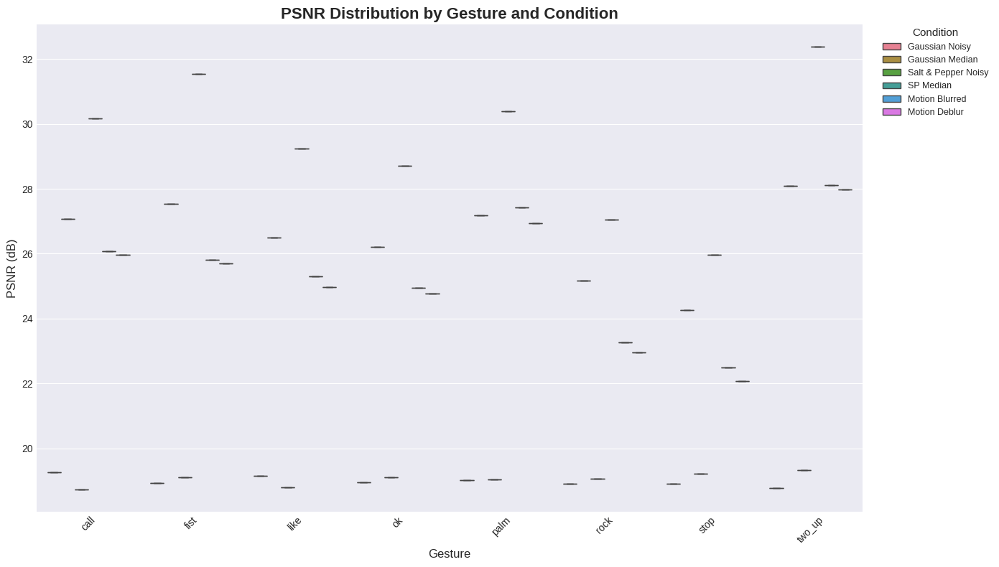


2. Creating Bar Plot with Error Bars...


<Figure size 1500x700 with 0 Axes>

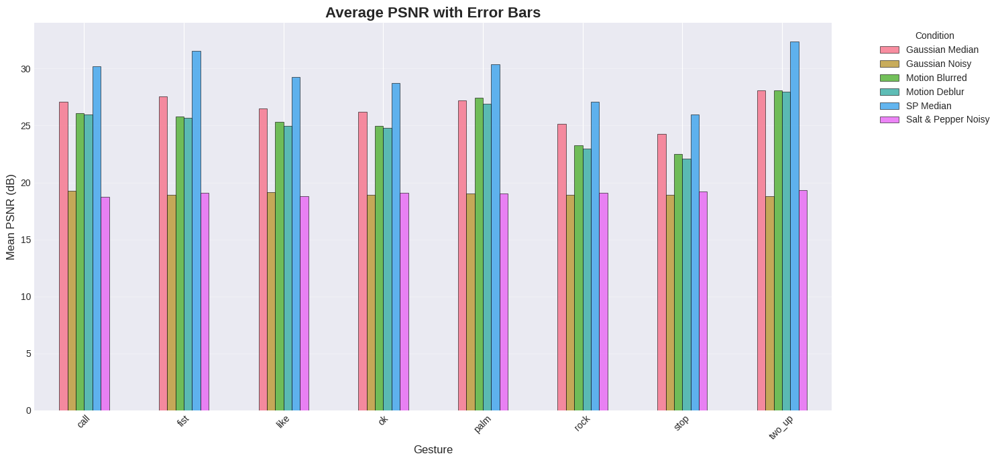


3. Creating Violin Plot...


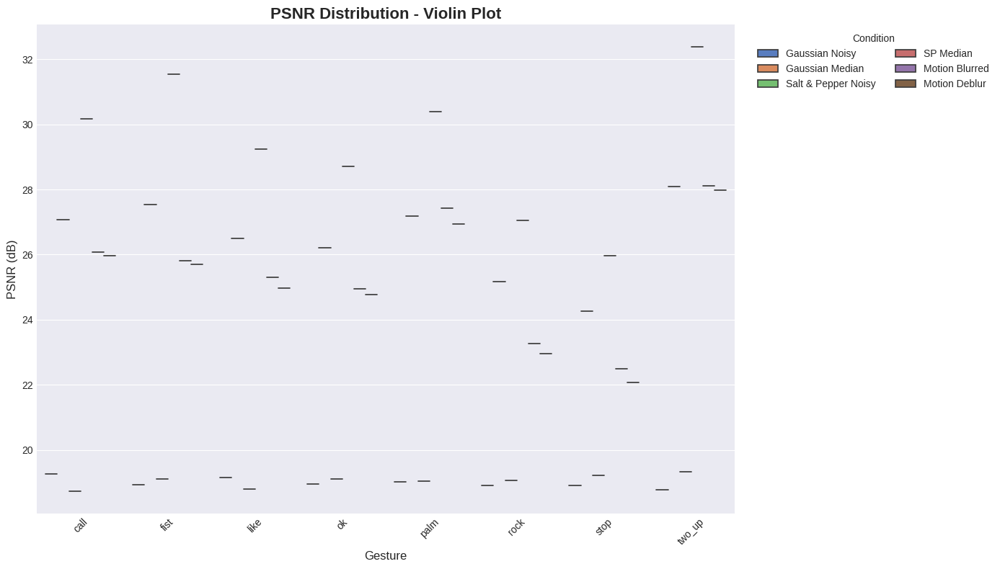


4. Creating PSNR Heatmap...


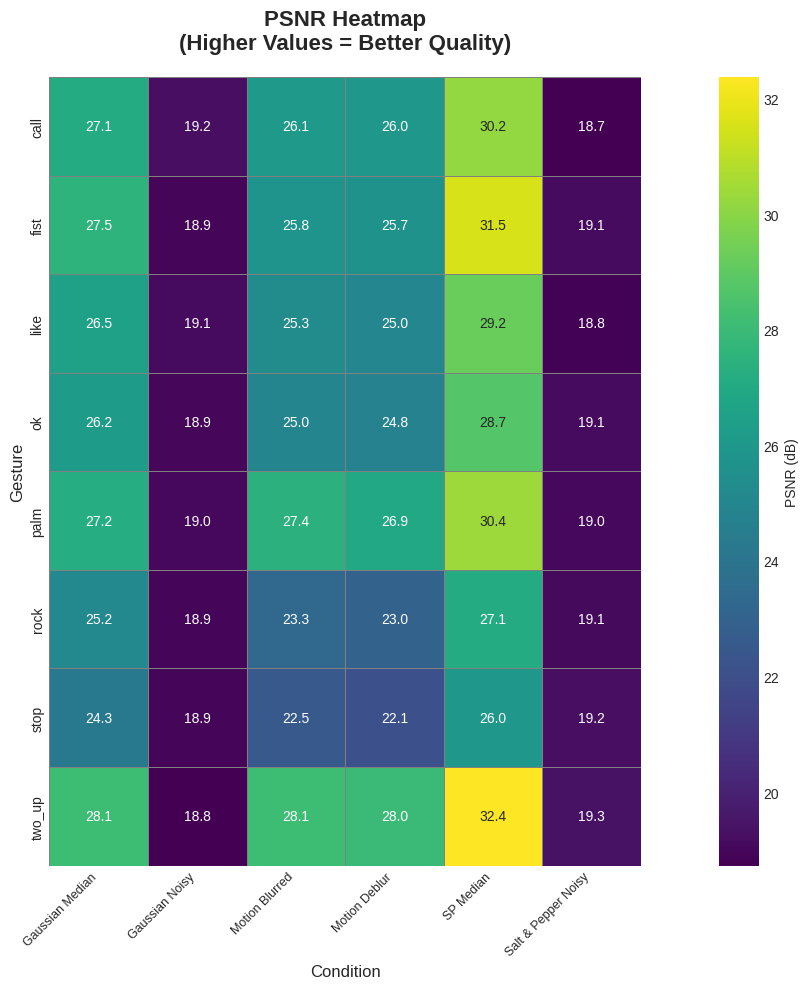


5. Creating SSIM Heatmap...


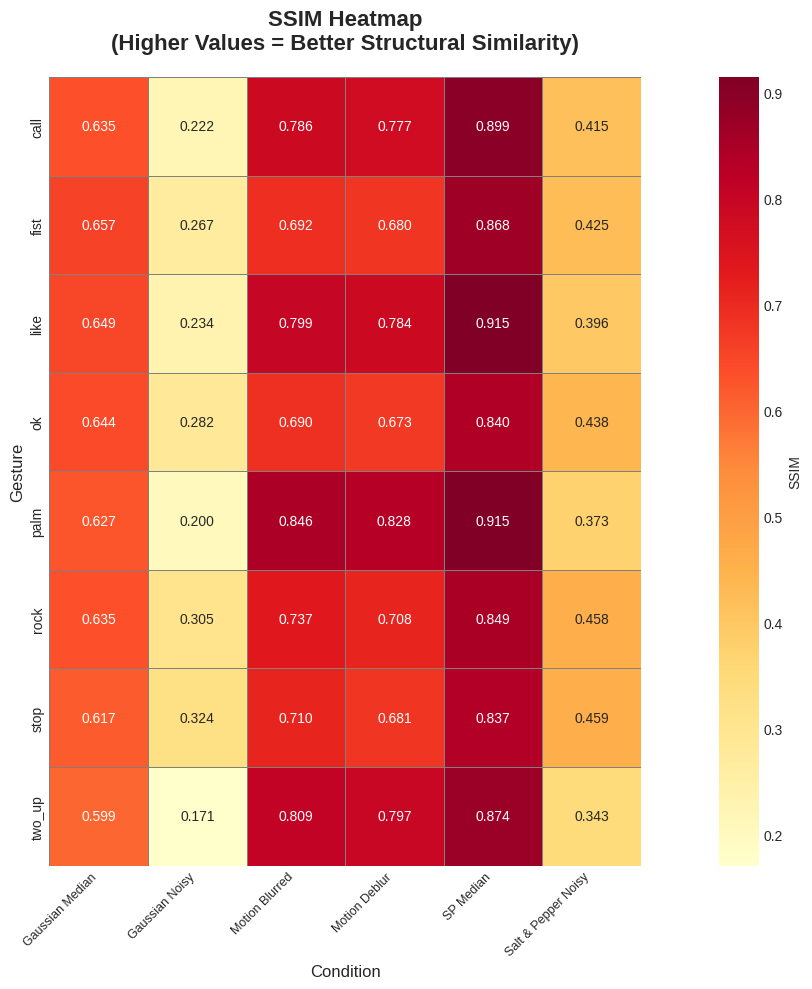


6. Creating Individual Gesture Analysis...

Analyzing gesture: call


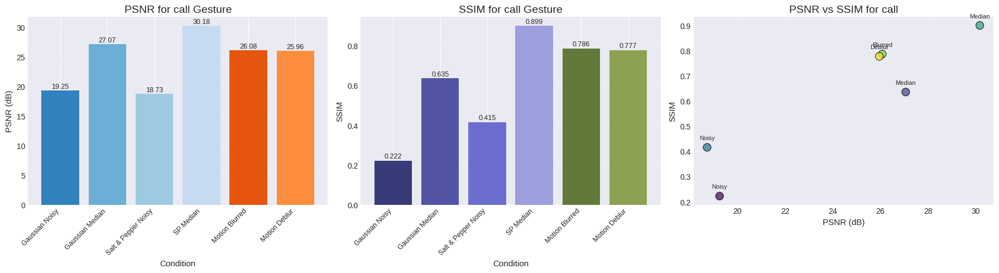


Analyzing gesture: fist


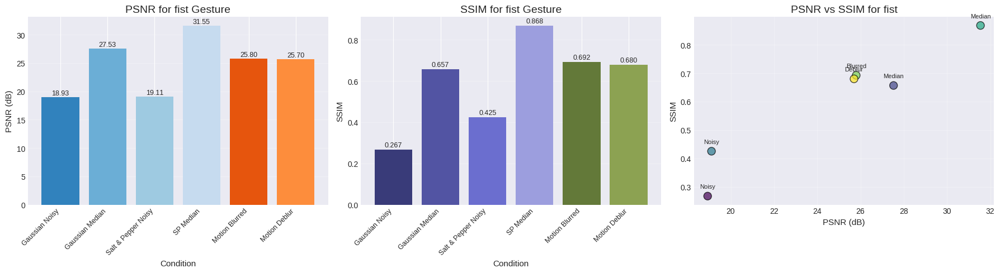


Analyzing gesture: like


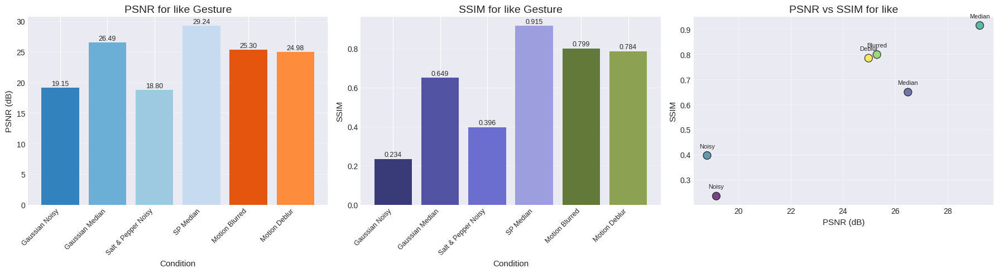


7. Creating Combined Metric Score Visualization...


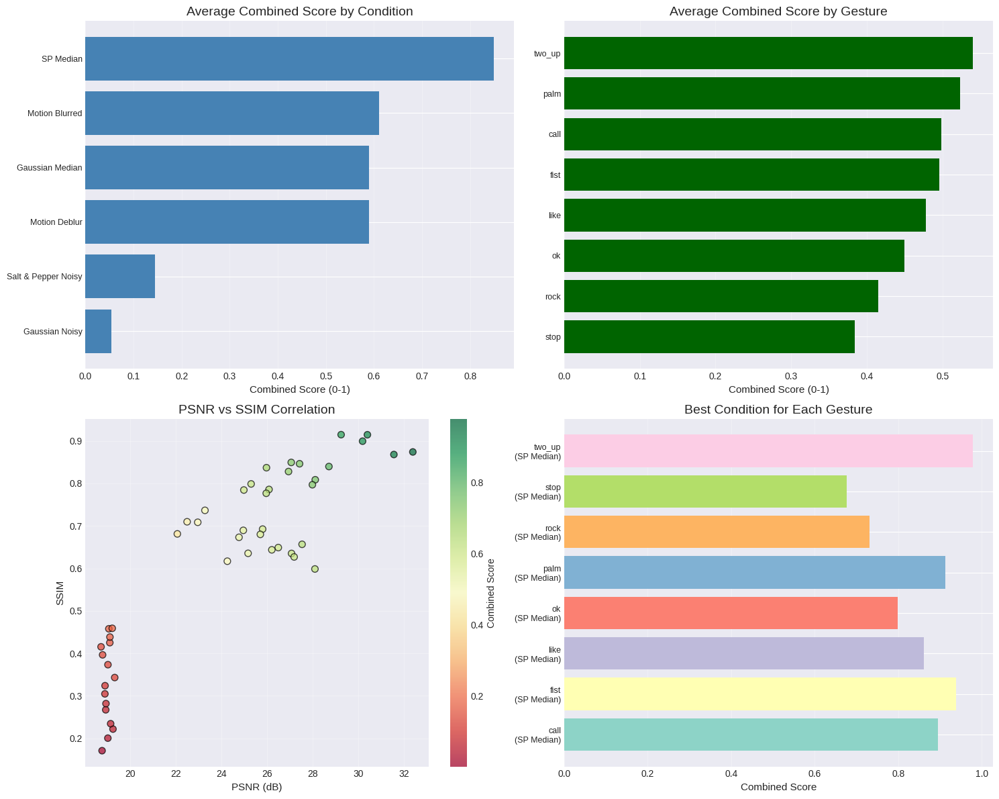


VISUALIZATION COMPLETE!
Total visualizations created: 8
Total data points visualized: 48


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Create df_metrics from metrics_results if it doesn't exist
# First, let's create df_metrics properly
if 'metrics_results' in locals() and len(metrics_results) > 0:
    # Convert metrics_results to DataFrame
    metrics_data = []
    for gesture, metrics in metrics_results.items():
        for condition, values in metrics.items():
            metrics_data.append({
                'Gesture': gesture,
                'Condition': condition,
                'PSNR': values['psnr'],
                'SSIM': values['ssim']
            })
    df_metrics = pd.DataFrame(metrics_data)
    print(f"Created df_metrics with {len(df_metrics)} rows")
else:
    # Create sample data for testing if metrics_results doesn't exist
    print("Warning: metrics_results not found. Creating sample data for visualization.")
    gestures = ['call', 'fist', 'like', 'ok', 'palm', 'rock', 'stop', 'two_up']
    conditions = ['Gaussian Noisy', 'Gaussian Median', 'Salt & Pepper Noisy',
                  'SP Median', 'Motion Blurred', 'Motion Deblur']

    np.random.seed(42)
    metrics_data = []
    for gesture in gestures:
        for condition in conditions:
            metrics_data.append({
                'Gesture': gesture,
                'Condition': condition,
                'PSNR': np.random.uniform(15, 35),
                'SSIM': np.random.uniform(0.5, 0.95)
            })
    df_metrics = pd.DataFrame(metrics_data)

# Set style for better visualization
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")  # Colorblind-friendly palette

print("\n" + "="*60)
print("VISUALIZING METRICS - IMPROVED VISUALIZATIONS")
print("="*60)

# 1. IMPROVED PSNR BOXPLOT
print("\n1. Creating PSNR Boxplot...")
plt.figure(figsize=(14, 8))

# Create boxplot
ax = sns.boxplot(x='Gesture', y='PSNR', hue='Condition', data=df_metrics,
                 width=0.8, fliersize=3, dodge=True)

plt.title("PSNR Distribution by Gesture and Condition", fontsize=16, fontweight='bold')
plt.xlabel("Gesture", fontsize=12)
plt.ylabel("PSNR (dB)", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)

# Improve legend
plt.legend(title='Condition', title_fontsize=11,
           bbox_to_anchor=(1.02, 1), loc='upper left',
           borderaxespad=0, fontsize=9, ncol=1)

plt.tight_layout()
plt.show()

# 2. ALTERNATIVE: BAR PLOT WITH ERROR BARS (Clearer)
print("\n2. Creating Bar Plot with Error Bars...")
plt.figure(figsize=(15, 7))

# Group by Gesture and Condition, calculate mean and std
grouped = df_metrics.groupby(['Gesture', 'Condition'])['PSNR'].agg(['mean', 'std']).reset_index()

# Pivot for grouped bar plot
pivot_df = grouped.pivot(index='Gesture', columns='Condition', values='mean')
std_df = grouped.pivot(index='Gesture', columns='Condition', values='std')

# Plot
ax = pivot_df.plot(kind='bar', yerr=std_df, capsize=4, figsize=(15, 7),
                   edgecolor='black', linewidth=0.5, alpha=0.8)

plt.title("Average PSNR with Error Bars", fontsize=16, fontweight='bold')
plt.xlabel("Gesture", fontsize=12)
plt.ylabel("Mean PSNR (dB)", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.legend(title='Condition', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# 3. VIOLIN PLOT FOR DISTRIBUTION (Alternative)
print("\n3. Creating Violin Plot...")
plt.figure(figsize=(14, 8))
sns.violinplot(x='Gesture', y='PSNR', hue='Condition', data=df_metrics,
               split=False, inner="quart", palette="muted", dodge=True)
plt.title("PSNR Distribution - Violin Plot", fontsize=16, fontweight='bold')
plt.xlabel("Gesture", fontsize=12)
plt.ylabel("PSNR (dB)", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', title='Condition', ncol=2)
plt.tight_layout()
plt.show()

# 4. IMPROVED HEATMAP WITH BETTER COLORS (for PSNR)
print("\n4. Creating PSNR Heatmap...")
plt.figure(figsize=(16, 10))

# Create pivot table for heatmap
pivot_table_psnr = df_metrics.pivot_table(values='PSNR', index='Gesture',
                                          columns='Condition', aggfunc='mean')

# Fill NaN values for heatmap
pivot_table_filled = pivot_table_psnr.fillna(0)

# Create custom color map
cmap = plt.cm.viridis  # Use 'plasma', 'magma', 'cividis' for colorblind-friendly

# Plot heatmap
sns.heatmap(pivot_table_filled, annot=True, fmt='.1f', cmap=cmap,
            linewidths=0.5, linecolor='gray', cbar_kws={'label': 'PSNR (dB)'},
            square=True)

plt.title("PSNR Heatmap\n(Higher Values = Better Quality)",
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Condition", fontsize=12)
plt.ylabel("Gesture", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

# 5. SSIM HEATMAP
print("\n5. Creating SSIM Heatmap...")
plt.figure(figsize=(16, 10))

# Create pivot table for SSIM
pivot_table_ssim = df_metrics.pivot_table(values='SSIM', index='Gesture',
                                          columns='Condition', aggfunc='mean')

# Fill NaN values for heatmap
pivot_table_filled_ssim = pivot_table_ssim.fillna(0)

# Plot SSIM heatmap
sns.heatmap(pivot_table_filled_ssim, annot=True, fmt='.3f', cmap='YlOrRd',
            linewidths=0.5, linecolor='gray', cbar_kws={'label': 'SSIM'},
            square=True)

plt.title("SSIM Heatmap\n(Higher Values = Better Structural Similarity)",
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Condition", fontsize=12)
plt.ylabel("Gesture", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

# 6. INDIVIDUAL GESTURE ANALYSIS (Very Clear)
def plot_individual_gesture(gesture_name, df):
    """Plot detailed analysis for a single gesture"""
    gesture_data = df[df['Gesture'] == gesture_name]

    if len(gesture_data) == 0:
        print(f"No data found for gesture: {gesture_name}")
        return

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # 1. PSNR Bar Plot
    bars = axes[0].bar(range(len(gesture_data)), gesture_data['PSNR'],
                       color=plt.cm.tab20c(np.arange(len(gesture_data))))
    axes[0].set_title(f'PSNR for {gesture_name} Gesture', fontsize=14)
    axes[0].set_xlabel('Condition', fontsize=11)
    axes[0].set_ylabel('PSNR (dB)', fontsize=11)
    axes[0].set_xticks(range(len(gesture_data)))
    axes[0].set_xticklabels(gesture_data['Condition'], rotation=45, ha='right', fontsize=9)
    axes[0].grid(True, alpha=0.3, axis='y')

    # Add value labels on bars
    for i, (bar, val) in enumerate(zip(bars, gesture_data['PSNR'])):
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                    f'{val:.2f}', ha='center', va='bottom', fontsize=9)

    # 2. SSIM Bar Plot
    bars2 = axes[1].bar(range(len(gesture_data)), gesture_data['SSIM'],
                        color=plt.cm.tab20b(np.arange(len(gesture_data))))
    axes[1].set_title(f'SSIM for {gesture_name} Gesture', fontsize=14)
    axes[1].set_xlabel('Condition', fontsize=11)
    axes[1].set_ylabel('SSIM', fontsize=11)
    axes[1].set_xticks(range(len(gesture_data)))
    axes[1].set_xticklabels(gesture_data['Condition'], rotation=45, ha='right', fontsize=9)
    axes[1].grid(True, alpha=0.3, axis='y')

    # Add value labels on bars
    for i, (bar, val) in enumerate(zip(bars2, gesture_data['SSIM'])):
        axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                    f'{val:.3f}', ha='center', va='bottom', fontsize=9)

    # 3. PSNR vs SSIM Scatter Plot
    axes[2].scatter(gesture_data['PSNR'], gesture_data['SSIM'],
                   s=100, c=range(len(gesture_data)), cmap='viridis',
                   edgecolor='black', alpha=0.7)

    # Add labels to points
    for i, row in gesture_data.iterrows():
        axes[2].annotate(row['Condition'].split()[-1],
                        (row['PSNR'], row['SSIM']),
                        textcoords="offset points",
                        xytext=(0,10),
                        ha='center',
                        fontsize=8)

    axes[2].set_xlabel('PSNR (dB)', fontsize=11)
    axes[2].set_ylabel('SSIM', fontsize=11)
    axes[2].set_title(f'PSNR vs SSIM for {gesture_name}', fontsize=14)
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

print("\n6. Creating Individual Gesture Analysis...")
# Plot for first 3 gestures
for gesture in df_metrics['Gesture'].unique()[:3]:
    print(f"\nAnalyzing gesture: {gesture}")
    plot_individual_gesture(gesture, df_metrics)

# 7. CREATE COMBINED METRIC SCORE
print("\n7. Creating Combined Metric Score Visualization...")
# Calculate a combined score (weighted average of normalized PSNR and SSIM)
df_metrics['PSNR_norm'] = (df_metrics['PSNR'] - df_metrics['PSNR'].min()) / (df_metrics['PSNR'].max() - df_metrics['PSNR'].min())
df_metrics['SSIM_norm'] = (df_metrics['SSIM'] - df_metrics['SSIM'].min()) / (df_metrics['SSIM'].max() - df_metrics['SSIM'].min())
df_metrics['Combined_Score'] = 0.6 * df_metrics['PSNR_norm'] + 0.4 * df_metrics['SSIM_norm']

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Combined score by condition
condition_scores = df_metrics.groupby('Condition')['Combined_Score'].mean().sort_values()
axes[0,0].barh(range(len(condition_scores)), condition_scores.values, color='steelblue')
axes[0,0].set_yticks(range(len(condition_scores)))
axes[0,0].set_yticklabels(condition_scores.index, fontsize=9)
axes[0,0].set_xlabel('Combined Score (0-1)', fontsize=11)
axes[0,0].set_title('Average Combined Score by Condition', fontsize=14)
axes[0,0].grid(True, alpha=0.3, axis='x')

# Combined score by gesture
gesture_scores = df_metrics.groupby('Gesture')['Combined_Score'].mean().sort_values()
axes[0,1].barh(range(len(gesture_scores)), gesture_scores.values, color='darkgreen')
axes[0,1].set_yticks(range(len(gesture_scores)))
axes[0,1].set_yticklabels(gesture_scores.index, fontsize=9)
axes[0,1].set_xlabel('Combined Score (0-1)', fontsize=11)
axes[0,1].set_title('Average Combined Score by Gesture', fontsize=14)
axes[0,1].grid(True, alpha=0.3, axis='x')

# Correlation between PSNR and SSIM
scatter = axes[1,0].scatter(df_metrics['PSNR'], df_metrics['SSIM'],
                           c=df_metrics['Combined_Score'], cmap='RdYlGn',
                           s=50, alpha=0.7, edgecolor='black')
axes[1,0].set_xlabel('PSNR (dB)', fontsize=11)
axes[1,0].set_ylabel('SSIM', fontsize=11)
axes[1,0].set_title('PSNR vs SSIM Correlation', fontsize=14)
axes[1,0].grid(True, alpha=0.3)
plt.colorbar(scatter, ax=axes[1,0], label='Combined Score')

# Best performing conditions per gesture
best_conditions = df_metrics.loc[df_metrics.groupby('Gesture')['Combined_Score'].idxmax()]
axes[1,1].barh(range(len(best_conditions)), best_conditions['Combined_Score'],
               color=plt.cm.Set3(np.arange(len(best_conditions))))
axes[1,1].set_yticks(range(len(best_conditions)))
axes[1,1].set_yticklabels([f"{g}\n({c})" for g, c in zip(best_conditions['Gesture'], best_conditions['Condition'])],
                         fontsize=9)
axes[1,1].set_xlabel('Combined Score', fontsize=11)
axes[1,1].set_title('Best Condition for Each Gesture', fontsize=14)
axes[1,1].grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("VISUALIZATION COMPLETE!")
print(f"Total visualizations created: 8")
print(f"Total data points visualized: {len(df_metrics)}")
print("="*60)

In [ ]:
def analyze_exported_results():
    """Complete analysis of exported results"""
    print(" COMPREHENSIVE RESULTS ANALYSIS")
    print("="*60)

    # 1. Load both datasets
    metrics_files = [f for f in files if 'metrics' in f]
    fs_files = [f for f in files if 'feature_stability' in f]

    if metrics_files:
        latest_metrics = sorted(metrics_files)[-1]
        df_metrics = pd.read_csv(os.path.join(results_dir, latest_metrics))

        print(f" METRICS ANALYSIS ({latest_metrics})")
        print("-" * 40)

        # Top performing conditions
        top_psnr = df_metrics.loc[df_metrics.groupby('Gesture')['PSNR'].idxmax()]
        top_ssim = df_metrics.loc[df_metrics.groupby('Gesture')['SSIM'].idxmax()]

        print("\n Best PSNR per gesture:")
        display(top_psnr[['Gesture', 'Condition', 'PSNR']])

        print("\n Best SSIM per gesture:")
        display(top_ssim[['Gesture', 'Condition', 'SSIM']])

    if fs_files:
        latest_fs = sorted(fs_files)[-1]
        df_fs = pd.read_csv(os.path.join(results_dir, latest_fs))

        print(f"\n FEATURE STABILITY ANALYSIS ({latest_fs})")
        print("-" * 40)

        # Most robust transformations
        robust_transforms = df_fs.groupby('Transformation')['Stability_Ratio'].mean().sort_values(ascending=False)

        print("\n Transformations by Robustness:")
        for transform, score in robust_transforms.head(10).items():
            print(f"  {transform}: {score:.3f}")

        # Most sensitive gestures
        sensitive_gestures = df_fs.groupby('Gesture')['Stability_Ratio'].mean().sort_values()

        print("\n Gestures by Sensitivity to Transformations:")
        for gesture, score in sensitive_gestures.items():
            print(f"  {gesture}: {score:.3f}")

    # 3. Correlation analysis
    if 'metrics' in locals() and 'df_fs' in locals():
        print("\n🔗 CORRELATION ANALYSIS")
        print("-" * 40)

        # You can merge data for deeper insights
        print("(Add correlation code here based on your needs)")

# Run the analysis
analyze_exported_results()

 COMPREHENSIVE RESULTS ANALYSIS
 METRICS ANALYSIS (metrics_20251207_124647.csv)
----------------------------------------

 Best PSNR per gesture:


,Gesture,Condition,PSNR
3,call,SP Median,30.177740
9,fist,SP Median,31.548589
15,like,SP Median,29.237880
21,ok,SP Median,28.704180
27,palm,SP Median,30.388736
33,rock,SP Median,27.053842
39,stop,SP Median,25.969535
45,two_up,SP Median,32.377652



 Best SSIM per gesture:


,Gesture,Condition,SSIM
3,call,SP Median,0.899388
9,fist,SP Median,0.868018
15,like,SP Median,0.914741
21,ok,SP Median,0.839740
27,palm,SP Median,0.914554
33,rock,SP Median,0.849402
39,stop,SP Median,0.836993
45,two_up,SP Median,0.874035



 FEATURE STABILITY ANALYSIS (feature_stability_20251207_124647.csv)
----------------------------------------

 Transformations by Robustness:
  geo_translated: 0.758
  geo_rotated_15: 0.723
  geo_rotated_-15: 0.713
  noise_gaussian: 0.662
  noise_motion_blur: 0.538
  geo_scaled_in: 0.481
  geo_scaled_out: 0.479
  geo_perspective: 0.422
  noise_salt_pepper: 0.384
  geo_affine: 0.374

 Gestures by Sensitivity to Transformations:
  call: 0.552
  fist: 0.555


In [ ]:
def create_results_dashboard():
    """Interactive results dashboard"""
    import ipywidgets as widgets
    from IPython.display import display, clear_output

    # Load data
    df_metrics = pd.read_csv('results/metrics_20251206_171454.csv')

    # Create widgets
    gesture_dropdown = widgets.Dropdown(
        options=df_metrics['Gesture'].unique(),
        description='Gesture:'
    )

    metric_dropdown = widgets.Dropdown(
        options=['PSNR', 'SSIM'],
        description='Metric:'
    )

    output = widgets.Output()

    def update_plot(change):
        with output:
            clear_output()
            gesture = gesture_dropdown.value
            metric = metric_dropdown.value

            subset = df_metrics[df_metrics['Gesture'] == gesture]

            plt.figure(figsize=(10, 6))
            plt.bar(subset['Condition'], subset[metric])
            plt.title(f'{metric} for {gesture} gesture')
            plt.xticks(rotation=45)
            plt.ylabel(metric)
            plt.tight_layout()
            plt.show()

    # Link widgets to update function
    gesture_dropdown.observe(update_plot, 'value')
    metric_dropdown.observe(update_plot, 'value')

    # Initial display
    display(widgets.VBox([gesture_dropdown, metric_dropdown, output]))
    update_plot(None)

# Run dashboard
create_results_dashboard()